In [361]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [496]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from tqdm import tqdm
from collections import defaultdict
from collections import OrderedDict
import gseapy as gp
import anndata
from scipy import stats
from adjustText import adjust_text
from plot_utils import *
from pyscenic.aucell import aucell
from matplotlib.pyplot import rc_context
from ctxcore.genesig import GeneSignature
import infercnvpy as cnv
from upsetplot import from_memberships
import upsetplot
from matplotlib import colormaps
import matplotlib
from upsetplot import UpSet, from_memberships
# **Statistical annotation (Example: Chi-square test or Fisher’s exact test)**
from scipy.stats import chi2_contingency
# sns.reset_orig()
sns.set_style('whitegrid')

In [71]:
# Download cell cycle genes
!if [ ! -f data/regev_lab_cell_cycle_genes.txt ]; then curl -o data/regev_lab_cell_cycle_genes.txt https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt; fi

# Download CIN information from Replogle et al.
!wget https://ars.els-cdn.com/content/image/1-s2.0-S0092867422005979-mmc2.xlsx

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   556  100   556    0     0   2326      0 --:--:-- --:--:-- --:--:--  2336


In [3]:
outdir = '../results'
figdir = f'{outdir}/overleaf/figures'
fontsize=14

#### Load data

In [4]:
def get_rpe1_adata(data_dir = '/mlbio_scratch/vinas/sc_perturbation_benchmark/data/replogle_rpe1_v2_2022'):
    adata = anndata.read_h5ad(f'{data_dir}/rpe1_raw_singlecell_01.h5ad')
    df_sub = pd.read_csv(f'{data_dir}/annotated_embedding_coordinates.csv')
    adata_ = adata[adata.obs['gene'].isin(list(df_sub.gene.values)+['non-targeting']), :]

    # Process
    sc.pp.normalize_total(adata_)
    sc.pp.log1p(adata_)
    sc.pp.highly_variable_genes(adata_, n_top_genes=5000, subset=False)
    hvg_flag_ = adata_.var['highly_variable'].values
    gene_flag_ = adata_.var['gene_name'].isin(adata_.obs['gene'].values).values
    select_flag_ = np.logical_or(hvg_flag_, gene_flag_)
    condition_flag_ = adata_.obs['gene'].isin(adata_.var['gene_name'].values.tolist()+['non-targeting']).values
    adata_subset = adata_[condition_flag_, select_flag_]
    adata_subset.obs['control'] = adata_subset.obs['gene'] == 'non-targeting'
    return adata_subset

In [5]:
adata = get_rpe1_adata()
adata.var['gene_id'] = adata.var.index
adata.obs['control'] = adata.obs['control'].astype('category')
adata.obs['control_str'] = ['control' if v else 'perturbed' for v in adata.obs['control']]

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:208: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipykernel_1654354/478153220.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_subset.obs['control'] = adata_subset.obs['gene'] == 'non-targeting'


In [6]:
cin_rpe1_df = pd.read_excel('1-s2.0-S0092867422005979-mmc2.xlsx', 3, index_col=0)
cin_rpe1_df['gene_id'] = cin_rpe1_df.index.str.split('_').str[-1]
cin_rpe1_df = cin_rpe1_df[~cin_rpe1_df['Z-scored CIN score'].isna()]
zscores_rpe1 = cin_rpe1_df[cin_rpe1_df['gene_id'].isin(adata.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()

#### Cell cycle analysis

In [140]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 5811 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


In [7]:
cell_cycle_genes = [x.strip() for x in open('./data/regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

97


In [9]:
adata_cc = adata.copy()
adata_cc.var_names = adata_cc.var['gene_name'].astype(str)
adata_cc.var_names_make_unique()
sc.tl.score_genes_cell_cycle(adata_cc, s_genes=s_genes, g2m_genes=g2m_genes)

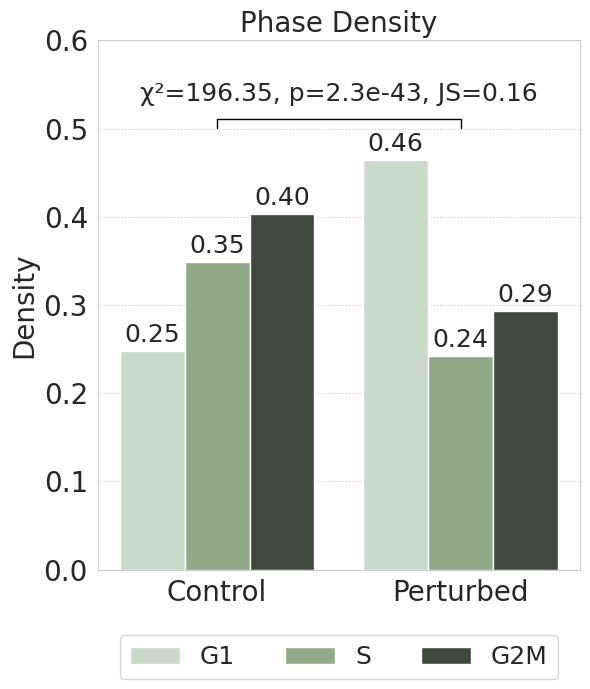

In [408]:
sns.set_style('whitegrid')
fontsize = 20

# Create DataFrame
data = []
key = 'phase'
c_mask = adata_cc.obs['control'].astype(bool)

# Extract values
c = adata_cc[c_mask].obs[key].value_counts()
pc = adata_cc[~c_mask].obs[key].value_counts()
categories = sorted(c.index)

# Normalize
c_norm = c / c.sum()
pc_norm = pc / pc.sum()

# Convert to long format for seaborn
for phase in categories:
    data.append(['Control', phase, c_norm[phase]])
    data.append(['Perturbed', phase, pc_norm[phase]])

df = pd.DataFrame(data, columns=['Condition', 'Phase', 'Density'])

# Plot
plt.figure(figsize=(6, 7))
ax = sns.barplot(data=df, x='Condition', y='Density', hue='Phase',
                 palette={"control": "tab:blue", "perturbed": "lightgray", "S": "#8DB081", "G1": "#C8DBC8", "G2M": "#3E4A3B"},
                 hue_order=['G1', 'S', 'G2M'],
                )  # , edgecolor='black'

# **Add numerical labels on bars**
for bar in ax.patches:
    height = bar.get_height()
    if height > 0:  # Avoid labeling bars with zero height
        ax.text(bar.get_x() + bar.get_width()/2, height + 0.01, 
                f'{height:.2f}', ha='center', fontsize=fontsize-2)

# Contingency table
table = np.array([list(c), list(pc)])  # Observed values
chi2, p, _, _ = chi2_contingency(table)

# **Add a horizontal line for significance**
y_max = df['Density'].max()  # Find the highest bar
y_line = y_max * 1.1  # Position of the horizontal line
x1, x2 = 0, 1  # Positions for Control and Perturbed

ax.plot([x1, x1, x2, x2], [y_line-0.01, y_line, y_line, y_line-0.01], 
        lw=1, color='black')

# **Annotate p-value above the line**
# p_text = f"p = {p:.3f}" if p >= 0.001 else "p < 0.001"  # Format p-value
p_text = f"χ²={chi2:.2f}, p={p:.1e}, JS={jensenshannon(c_norm.loc[['G1', 'S', 'G2M']], pc_norm.loc[['G1', 'S', 'G2M']]):.2f}"
ax.text((x1 + x2) / 2, y_line + 0.02, p_text, ha='center', fontsize=fontsize-2)

# Labels & title
ax.set_title('Phase Density', fontsize=fontsize)
ax.set_ylabel('Density', fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
ax.set_xlabel('')

legend = plt.legend(title='', fontsize=fontsize-2, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=False, ncol=5)
# plt.setp(legend.get_title(),fontsize=fontsize)
# plt.grid(axis='y', linestyle='dotted')
plt.gca().set_axisbelow(True)
plt.ylim((0, 0.6))
plt.tight_layout()
plt.grid(linestyle='dotted', axis='y')
plt.savefig(f'{figdir}/replogle_rpe1_phase_density.pdf', bbox_inches='tight');
plt.show()

In [125]:
file = f'../data/replogle_k562_v2_2022/replogle_k562_v2_2022_{seed}.h5ad'
adata_k562 = anndata.read_h5ad(file)
adata_k562

NameError: name 'seed' is not defined

In [88]:
adata_k562.var_names = adata_k562.var['gene_name'].astype(str)
adata_k562.var_names_make_unique()
sc.tl.score_genes_cell_cycle(adata_k562, s_genes=s_genes, g2m_genes=g2m_genes)

In [60]:
sc.pp.neighbors(adata_k562)
sc.tl.umap(adata_k562)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


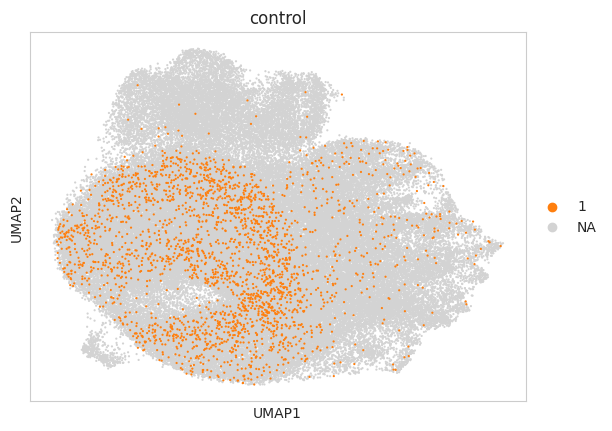

In [90]:
sc.pl.umap(adata_k562, color='control',
           groups=[1], size=10)

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


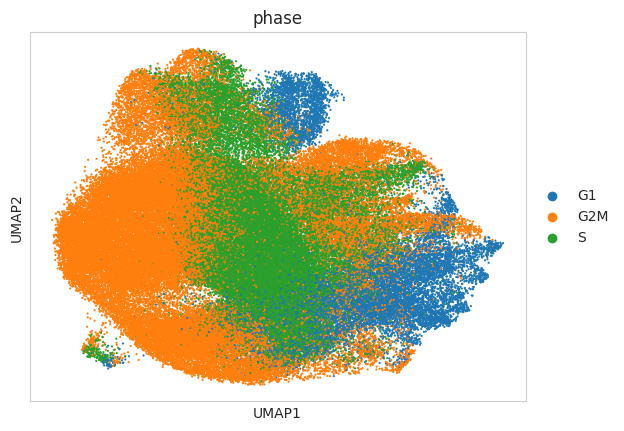

In [92]:
sc.pl.umap(adata_k562, color='phase', size=10)

In [131]:
file = f'../data/replogle_k562_gwps_2022/replogle_k562_gwps_2022_1.h5ad'
adata_k562_gwps = anndata.read_h5ad(file)

In [63]:
sc.pp.neighbors(adata_k562_gwps)
sc.tl.umap(adata_k562_gwps)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


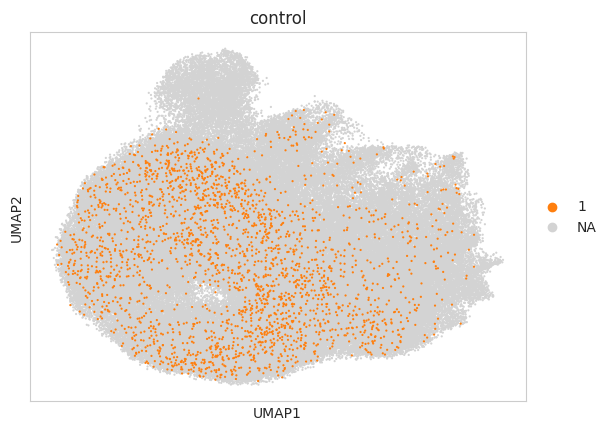

In [64]:
sc.pl.umap(adata_k562_gwps, color='control',
           groups=[1], size=10)

#### CIN

In [11]:
cin_rpe1_df = pd.read_excel('1-s2.0-S0092867422005979-mmc2.xlsx', 3, index_col=0)
cin_k562_df = pd.read_excel('1-s2.0-S0092867422005979-mmc2.xlsx', 1, index_col=0)
cin_k562_df['gene_id'] = cin_k562_df.index.str.split('_').str[-1]
cin_rpe1_df['gene_id'] = cin_rpe1_df.index.str.split('_').str[-1]
cin_rpe1_df = cin_rpe1_df[~cin_rpe1_df['Z-scored CIN score'].isna()]

In [132]:
# zscores_k562 = cin_k562_df[cin_k562_df['gene_id'].isin(adata_k562.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()
zscores_k562_gwps = cin_k562_df[cin_k562_df['gene_id'].isin(adata_k562_gwps.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()
zscores_rpe1 = cin_rpe1_df[cin_rpe1_df['gene_id'].isin(adata.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()
# zscores_k562 = zscores_k562[zscores_k562.index != 'non-targeting']
# zscores_rpe1 = zscores_rpe1[zscores_rpe1.index != 'non-targeting']
yscores_df = pd.DataFrame({
    'Z-scored CIN score': list(zscores_k562_gwps.values) + list(zscores_rpe1.values),
    '': ['K562'] * len(zscores_k562_gwps) + ['RPE1 (essential)'] * len(zscores_rpe1)
})

In [ ]:
zscores_k562 = cin_k562_df[cin_k562_df['gene_id'].isin(adata_k562.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()
zscores_k562_gwps = cin_k562_df[cin_k562_df['gene_id'].isin(adata_k562_gwps.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()
zscores_rpe1 = cin_rpe1_df[cin_rpe1_df['gene_id'].isin(adata.obs['gene_id'].unique())].groupby('gene_id')['Z-scored CIN score'].mean()
# zscores_k562 = zscores_k562[zscores_k562.index != 'non-targeting']
# zscores_rpe1 = zscores_rpe1[zscores_rpe1.index != 'non-targeting']
yscores_df = pd.DataFrame({
    'Z-scored CIN score': list(zscores_k562_gwps.values) + list(zscores_k562.values) + list(zscores_rpe1.values),
    '': ['K562'] * len(zscores_k562_gwps) + ['K562 (essential)'] * len(zscores_k562) + ['RPE1 (essential)'] * len(zscores_rpe1)
})

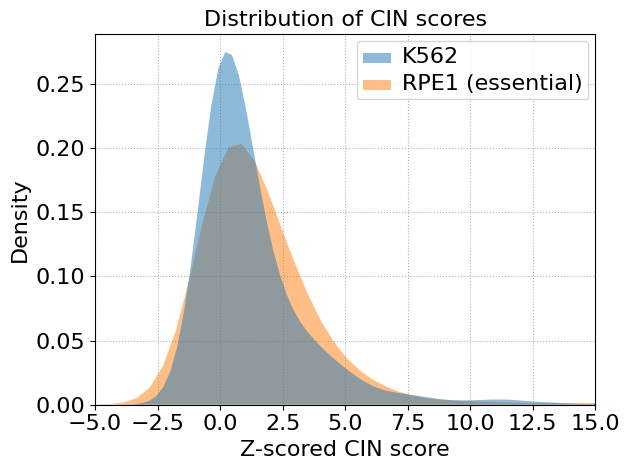

In [927]:
fontsize = 16
plt.title('Distribution of CIN scores', fontsize=fontsize)
ax = sns.kdeplot(data=yscores_df, x='Z-scored CIN score', hue='', common_norm=False,
                 fill=True, alpha=0.5,  linewidth=0) # , multiple="fill")
ax.set_xlim((-5, 15))
# handles, labels = ax.get_legend_handles_labels()
# legend = fig.legend(handles, labels, fontsize=fontsize)
plt.setp(ax.get_legend().get_texts(), fontsize=fontsize) # for legend text

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Density', fontsize=fontsize)
plt.xlabel('Z-scored CIN score', fontsize=fontsize)
plt.grid(linestyle='dotted')
plt.gca().set_axisbelow(True)
# ax.set_xscale("symlog", linthresh=1)  # linthresh defines the linear region around zero
plt.tight_layout()
# plt.savefig(f'{figdir}/replogle_rpe1vsk562_cin_scores.pdf', bbox_inches='tight');
# plt.savefig(f'{figdir}/replogle_rpe1vsk562_cin_scores.pdf', bbox_inches='tight');
plt.savefig(f'{figdir}/replogle_rpe1vsk562_gwps_cin_scores.pdf', bbox_inches='tight');
plt.show()

#### UMAP

In [12]:
df = adata.var[['gene_name']].copy()
df.loc['non-targeting'] = 'non-targeting'
zscores_rpe1_genename = zscores_rpe1.copy()
zscores_rpe1_genename = zscores_rpe1_genename[zscores_rpe1_genename.index.isin(adata.obs['gene_id'].unique())].reset_index().groupby('gene_id')[['Z-scored CIN score']].mean()
zscores_rpe1_genename['gene_name'] = df.loc[zscores_rpe1_genename.index]
zscores_rpe1_genename = zscores_rpe1_genename.set_index('gene_name')

In [145]:
def symlog(x, linthresh=1):
    return np.sign(x) * np.log1p(np.abs(x) / linthresh)

ad = adata[adata.obs['gene'].isin(list(zscores_rpe1_genename.index) + ['non-targeting'])]
ad.obs['Group Z-scored CIN score'] = zscores_rpe1_genename.loc[ad.obs['gene']]['Z-scored CIN score'].values
ad.obs['Symlog group Z-scored CIN score'] = symlog(ad.obs['Group Z-scored CIN score'])

/tmp/ipykernel_1654354/839155717.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs['Group Z-scored CIN score'] = zscores_rpe1_genename.loc[ad.obs['gene']]['Z-scored CIN score'].values


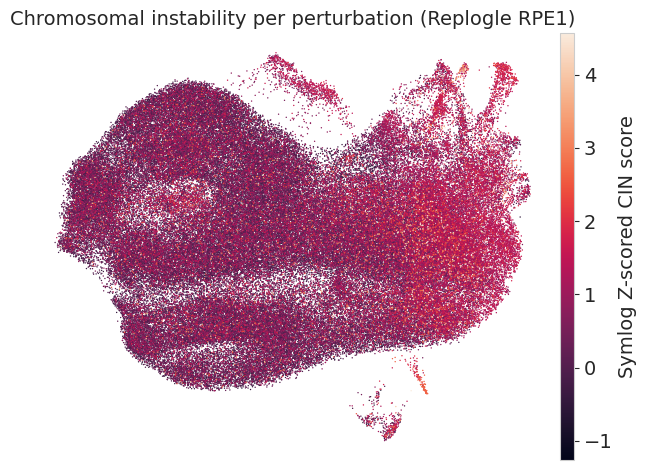

In [518]:
# RPE1 cells with abnormal karyotypes tended to arrest in G1 or G0 of the cell cycle
ax = sc.pl.umap(ad, color='Symlog group Z-scored CIN score', s=4, colorbar_loc='right', show=False, frameon=False)
cbar = ax.collections[0].colorbar  # Get the colorbar
cbar.set_label("Symlog Z-scored CIN score", fontsize=fontsize)  # Set your desired colorbar title
cbar.ax.tick_params(labelsize=fontsize)
plt.title('Chromosomal instability per perturbation (Replogle RPE1)', fontsize=fontsize);
plt.tight_layout()
# plt.savefig(f'{figdir}/replogle_rpe1vsk562_cin_scores.pdf', bbox_inches='tight');
plt.savefig(f'{figdir}/replogle_rpe1_cin_UMAP.pdf', bbox_inches='tight');
plt.savefig(f'{figdir}/replogle_rpe1_cin_UMAP.png', bbox_inches='tight', dpi=1200);

<Axes: xlabel='0', ylabel='1'>

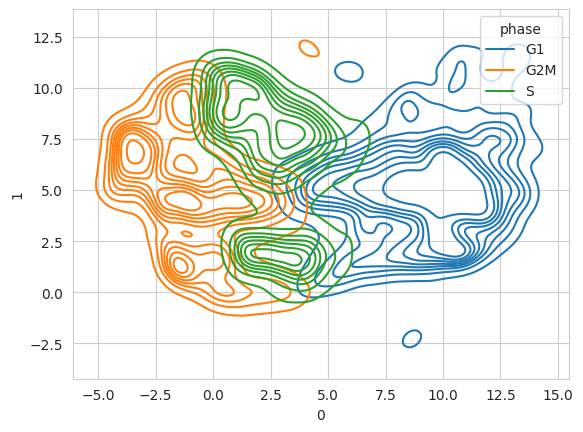

In [571]:
sns.kdeplot(umap_df, x=0, y=1, hue='phase')

In [148]:
ad_ = ad.copy()
ad_.var['gene_id'] = ad_.var.index
ad_.var.index = ad_.var['gene_name'].astype(str)
ad_.var_names_make_unique()
sc.tl.score_genes_cell_cycle(ad_, s_genes=s_genes, g2m_genes=g2m_genes)
ad

AnnData object with n_obs × n_vars = 147295 × 5811
    obs: 'gem_group', 'gene', 'gene_id', 'transcript', 'gene_transcript', 'sgID_AB', 'mitopercent', 'UMI_count', 'z_gemgroup_UMI', 'core_scale_factor', 'core_adjusted_UMI_count', 'control', 'control_str', 'Group Z-scored CIN score', 'Symlog group Z-scored CIN score'
    var: 'gene_name', 'chr', 'start', 'end', 'class', 'strand', 'length', 'in_matrix', 'mean', 'std', 'cv', 'fano', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_id'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/tmp/ipykernel_1654354/826051931.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


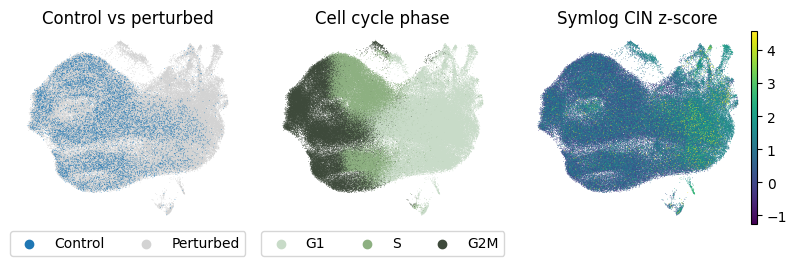

In [157]:
ad_.obs['control_str_nan'] = ['control' if v else np.nan for v in ad_.obs['control']]
with plt.rc_context({"figure.figsize": (3, 2.5)}):
    axs = sc.pl.umap(ad_, color=['control_str_nan', 'phase', 'Symlog group Z-scored CIN score'], # frameon=False,
               size=1,
               legend_loc='best',
               wspace=0.05,
               palette={"control": "tab:blue", "perturbed": "lightgray", "S": "#8DB081", "G1": "#C8DBC8", "G2M": "#3E4A3B"},
               na_in_legend=True,
               frameon=False,
               show=False)

handles, labels = axs[0].get_legend_handles_labels()
new_labels = {"control": "Control", "NA": "Perturbed"}  # Modify as needed
labels = [new_labels.get(label, label) for label in labels]  # Update labels
axs[0].legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0), fancybox=True, shadow=False, ncol=5)
handles, labels = axs[1].get_legend_handles_labels()
order = ['G1', 'S', 'G2M']
idxs = [labels.index(o) for o in order]
axs[1].legend([handles[i] for i in idxs], [labels[i] for i in idxs], loc='upper center', bbox_to_anchor=(0.5, 0), fancybox=True, shadow=False, ncol=5)
axs[0].set_title('Control vs perturbed')
axs[1].set_title('Cell cycle phase')
axs[2].set_title('Symlog CIN z-score')
plt.tight_layout()
plt.savefig(f'{figdir}/replogle_rpe1_combined_UMAP.pdf', bbox_inches='tight');
plt.savefig(f'{figdir}/replogle_rpe1_combined_UMAP.png', bbox_inches='tight', dpi=1200);
plt.show()

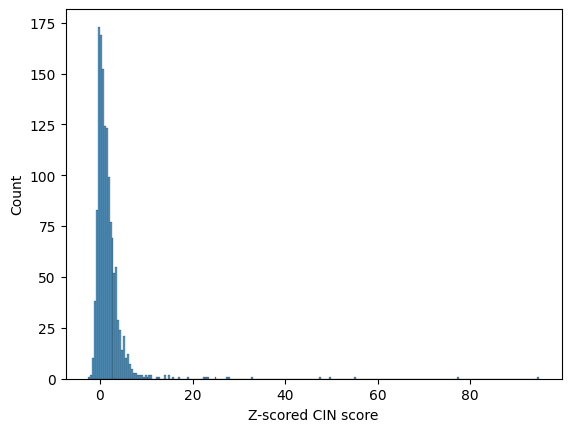

In [714]:
sns.histplot(zscores_rpe1_genename['Z-scored CIN score'])
plt.show()

In [ ]:
q1 = np.quantile(zscores_rpe1_genename['Z-scored CIN score'], 0.25)
q2 = np.quantile(zscores_rpe1_genename['Z-scored CIN score'], 0.5)
q3 = np.quantile(zscores_rpe1_genename['Z-scored CIN score'], 0.75)
q1, q2, q3

In [729]:
quantiles = [0.25, 0.5, 0.75, 1]
values = []
perts = {}
min_v = 0
for q in quantiles:
    v = np.quantile(zscores_rpe1_genename['Z-scored CIN score'], q)
    values.append(v)
    df = zscores_rpe1_genename
    perts[q] = df[np.logical_and(df['Z-scored CIN score'] > min_v, df['Z-scored CIN score'] < min_v + v)].index
    min_v += q
perts

{0.25: Index(['SNRNP40', 'MRPS35', 'TNPO3', 'TMED2', 'DESI1', 'TIMM9', 'PRPF6',
        'CHCHD3', 'CCDC6', 'EIF2B1', 'SPCS2', 'MRPS7', 'INTS11', 'DGCR8',
        'ZC3H4', 'NAA35', 'UQCRC2', 'NDUFB10', 'PGD', 'SERBP1', 'TSEN2',
        'GTF3C6', 'AP2M1', 'CAMLG', 'INTS1', 'SETD5', 'ATP5ME', 'HARS', 'NAA20',
        'CTU2', 'UBE2N', 'POGLUT3', 'MRPS16', 'NR2C2AP', 'DDX51', 'LAMTOR4',
        'ATP5MF', 'non-targeting'],
       dtype='object', name='gene_name'),
 0.5: Index(['KDM1A', 'RPAP3', 'SS18L2', 'UQCRC1', 'NUB1', 'COX15', 'MNAT1',
        'SNAPC1', 'KPNA6', 'FAM136A',
        ...
        'GTF2H4', 'MRPL23', 'FASTKD5', 'TMEM242', 'PET117', 'RPL36A', 'ARPC4',
        'MRPL20', 'POLR2M', 'BOP1'],
       dtype='object', name='gene_name', length=333),
 0.75: Index(['LAS1L', 'NDUFAB1', 'CIAPIN1', 'PSMB1', 'MED24', 'ZNF207', 'FYN',
        'UTP18', 'POLA2', 'MNAT1',
        ...
        'RBM12', 'EEF1G', 'POLR2M', 'BOP1', 'CCNQ', 'ZNHIT3', 'NOL12', 'AATF',
        'UHRF1', 'TADA2A'],
      

In [799]:
pre_res_q = {}
for q in quantiles:
    ad_q = ad[ad.obs['gene'].isin(perts[q])]
    X_q = ad_q.X.mean(axis=0)
    df_q = pd.DataFrame(X_q, index=ad_q.var['gene_name'].astype(str).values)[0]  # {g: v for g, v in zip(ad_q.var['gene_name'], X_q)}
    pre_res = gp.prerank(rnk=df_q,
                         gene_sets='GO_Biological_Process_2023',
                         threads=4,
                         # min_size=5,
                         # max_size=1000,
                         permutation_num=1000, # reduce number to speed up testing
                         outdir=None, # don't write to disk
                         seed=0,
                         verbose=True, # see what's going on behind the scenes
                        )
    pre_res_q[q] = pre_res

2025-03-18 17:04:43,532 [INFO] Input gene rankings contains duplicated IDs
2025-03-18 17:04:43,536 [INFO] Parsing data files for GSEA.............................
2025-03-18 17:04:43,536 [INFO] Enrichr library gene sets already downloaded in: /home/vinas/.cache/gseapy, use local file
2025-03-18 17:04:43,659 [INFO] 4321 gene_sets have been filtered out when max_size=500 and min_size=15
2025-03-18 17:04:43,661 [INFO] 1086 gene_sets used for further statistical testing.....
2025-03-18 17:04:43,661 [INFO] Start to run GSEA...Might take a while..................
2025-03-18 17:04:51,772 [INFO] Congratulations. GSEApy runs successfully................

2025-03-18 17:04:52,081 [INFO] Input gene rankings contains duplicated IDs
2025-03-18 17:04:52,084 [INFO] Parsing data files for GSEA.............................
2025-03-18 17:04:52,085 [INFO] Enrichr library gene sets already downloaded in: /home/vinas/.cache/gseapy, use local file
2025-03-18 17:04:52,194 [INFO] 4321 gene_sets have been filte

In [873]:
terms = pre_res_q[1].res2d.iloc[:10]['Term'].values
qvals_df = pd.DataFrame(columns=terms)
for q in quantiles:
    df = pre_res_q[q].res2d
    qvals_df.loc[q] = df.set_index('Term').loc[terms]['FDR q-val']
qvals_df_ = (qvals_df.T < 0.05).reset_index().set_index(quantiles)
qvals_df

# upset = UpSet(qvals_df_, subset_size="count", intersection_plot_elements=3)
# upset.plot()
# plt.show()

,Negative Regulation Of TOR Signaling (GO:0032007),Regulation Of DNA Damage Checkpoint (GO:2000001),Cytoplasmic Translation (GO:0002181),Peptide Biosynthetic Process (GO:0043043),Macromolecule Biosynthetic Process (GO:0009059),Translation (GO:0006412),Gene Expression (GO:0010467),Pyruvate Metabolic Process (GO:0006090),Positive Regulation Of Signal Transduction By P53 Class Mediator (GO:1901798),Aerobic Electron Transport Chain (GO:0019646)
0.25,0.121152,0.591266,0.0,0.0,0.0,0.0,0.000796,0.000829,0.002984,0.008311
0.50,0.506752,0.266438,0.0,0.0,0.0,0.0,0.000598,0.000664,0.000711,0.003785
0.75,0.16661,0.018376,0.0,0.0,0.0,0.0,0.000797,0.00083,0.001423,0.00137
1.00,0.0,0.0,0.0,0.0,0.0,0.000249,0.000398,0.000331,0.000568,0.002486


In [14]:
ad_cin_ctl = ad[np.logical_or(ad.obs['Symlog group Z-scored CIN score'] > 2, ad.obs['control'].astype(int) == 1)]

In [96]:
df = ad_cin_ctl.to_df().T
df.index = ad_cin_ctl.var.loc[df.index]['gene_name']
res = gp.gsea(data=df.reset_index(), # row -> genes, column-> samples
        gene_sets="GO_Biological_Process_2023",
        cls=ad_cin_ctl.obs['control'].values,
        permutation_num=500,
        permutation_type='phenotype',
        min_size=5,
        max_size=1000,
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
res.res2d['Term_'] = res.res2d['Term'].str.split('(').str[0]

2025-03-21 13:06:22,625 [WARNING] Found duplicated gene names, values averaged by gene names!
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/base.py:230: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby(level=0).mean()
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/gsea.py:105: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  df_std = df.groupby(by=cls_dict, axis=1).std(numeric_only=True)


In [15]:
res_allpert_res2d = pd.read_csv(f'{outdir}/replogleRPE1_gsea_bp.csv', index_col=0)
res_allpert_res2d['Term_'] = res_allpert_res2d['Term'].str.split('(').str[0]

In [169]:
selected_pathways = [# 'DNA Repair (GO:0006281)',
                     'DNA Repair ',
                     'Regulation Of Cell Cycle Process ',
                     # 'Mitotic Nuclear Division (GO:0140014)
]
selected_pathways = [# 'DNA Damage Response ',
                     # 'DNA Repair ',
                     # 'Regulation Of Cell Cycle Process ',
                     'Mitotic Spindle Organization ',
                     # 'Mitotic Nuclear Division '
]
selected_res = res_allpert_res2d.set_index('Term_').loc[selected_pathways] # res.res2d.set_index('Term_').loc[selected_pathways]
lead_genes = np.unique(';'.join(selected_res['Lead_genes'].values).split(';'))
lead_genes

n_cells_group = 200
gene_m = ad_cin_ctl.var['gene_name'].isin(lead_genes)
gene_names = ad_cin_ctl[:, gene_m].var['gene_name']
X_ctl = ad_cin_ctl[ad_cin_ctl.obs['control'].astype(bool), gene_m].X.toarray()
X_cin = ad_cin_ctl[~ad_cin_ctl.obs['control'].astype(bool), gene_m].X.toarray()
X_pert_all = ad[~ad.obs['control'].astype(bool), gene_m].X.toarray()
X_ctl_ss = X_ctl[np.random.choice(len(X_ctl), size=n_cells_group, replace=False)]
X_cin_ss = X_cin[np.random.choice(len(X_cin), size=n_cells_group, replace=False)]
X_pert_ss = X_pert_all[np.random.choice(len(X_pert_all), size=n_cells_group, replace=False)]
X = np.concatenate([X_ctl_ss, X_pert_ss, X_cin_ss], axis=0)
# X = np.concatenate([X_ctl_ss, X_pert_ss], axis=0)
# X = np.concatenate([X_ctl_ss, X_cin_ss], axis=0)
diff_exps = np.abs(X_cin.mean(axis=0) - X_ctl.mean(axis=0))
# gene_idxs = np.argsort(pvals[gene_m])[:20]
gene_idxs = np.argsort(diff_exps)[::-1][:25]
diff_exps[gene_idxs]
X.shape

(600, 33)

/tmp/ipykernel_1654354/2134867575.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10')
/tmp/ipykernel_1654354/2134867575.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expression_data = pd.DataFrame(X.T[gene_idxs], index=gene_names[gene_idxs])
/tmp/ipykernel_1654354/2134867575.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'lightblue' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  gene_color_matrix.loc[gene, pathway] = pathway_colors[pathway]
/tmp/ipykernel_1654354/2

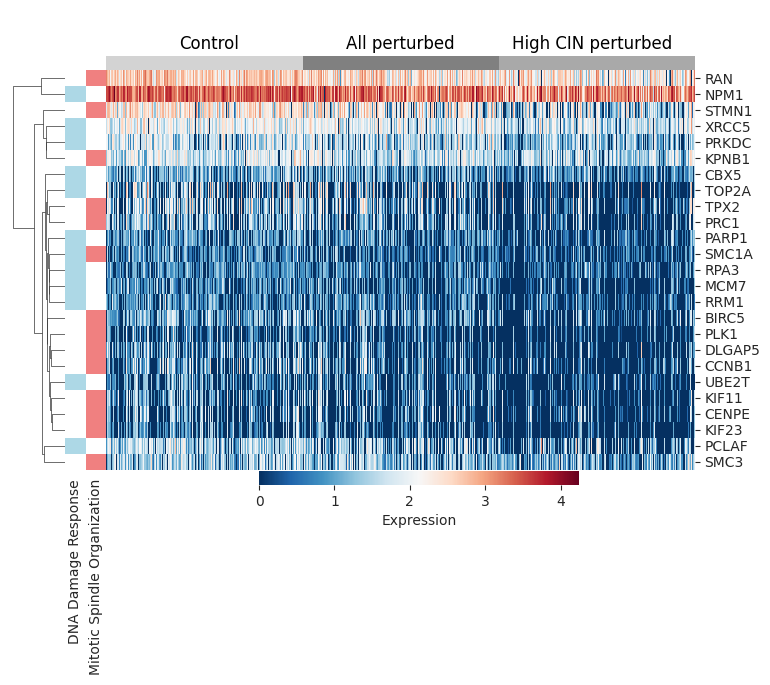

In [18]:
cmap = plt.cm.get_cmap('tab10')

# Example expression data
# expression_data = pd.DataFrame(X.T, index=gene_names)
expression_data = pd.DataFrame(X.T[gene_idxs], index=gene_names[gene_idxs])

# Pathways for each gene
gene_pathways = {
    g: [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] for g in gene_names
}

# Assign distinct colors for each pathway
colors = ['lightblue', 'lightcoral', 'lightgreen', 'orange']
pathway_colors = {p: colors[i] for i, p in enumerate(selected_pathways)}
gene_color_matrix = pd.DataFrame(index=expression_data.index, columns=pathway_colors.keys(), data=np.nan)
for gene, pathways in gene_pathways.items():
    for pathway in pathways:
        gene_color_matrix.loc[gene, pathway] = pathway_colors[pathway]

# Convert cell types into colors (e.g., Control=black, Perturbed=red)
cell_annotations = pd.DataFrame({
    "": ["Control"] * n_cells_group + ["Perturbed all"] * n_cells_group + ["High CIN perturbed"] * n_cells_group 
}, index=expression_data.columns)
lut_cells =  {"Control": "lightgray", "High CIN perturbed": "darkgray", "Perturbed all": "gray"}  # {"Control": "black", "Perturbed": "red"}
cell_colors = cell_annotations[""].map(lut_cells)

# Plot the heatmap with multi-colored row annotations
g = sns.clustermap(
    expression_data,
    cmap="RdBu_r",  # "vlag",  
    row_colors=gene_color_matrix,  # Multi-colored annotation
    col_colors=cell_colors,
    col_cluster=False,
    # cbar_pos = None,
    cbar_pos=(0.33, 0.3, 0.4, 0.02),  # Moves colorbar below & makes it horizontal
    cbar_kws={"orientation": "horizontal", "label": "Expression"},  # Transposes colorbar
    xticklabels=False,  # Removes cell labels
    dendrogram_ratio=(0.08, 0.1),
    figsize=(8, 7),
)

# Get axis for annotation
ax = g.ax_col_dendrogram  # The axis above the heatmap

# Manually annotate "Control" and "Perturbed"
ax.text(0.175, 0.25, "Control", ha="center", va="center", fontsize=12, color="black")
ax.text(0.5, 0.25, "All perturbed", ha="center", va="center", fontsize=12, color="black")
ax.text(0.825, 0.25, "High CIN perturbed", ha="center", va="center", fontsize=12, color="black")


# Hide the x-axis ticks
ax.set_xticks([])
ax.set_yticks([])
g.ax_heatmap.set_ylabel("")

# Also remove tick marks from row colors (pathway annotations)
g.ax_col_colors.tick_params(axis="y", which="both", length=0)
g.ax_row_colors.tick_params(axis="x", which="both", length=0)
xticklabels = []
for t in g.ax_row_colors.get_xticklabels():
    t.set_text(t.get_text().replace('Process ', ''))
    xticklabels.append(t)
g.ax_row_colors.set_xticklabels(xticklabels)

# plt.xlabel("Condition")
plt.ylabel("")  # Removes y-axis label
plt.savefig(f'{figdir}/replogle_rpe1_highCIN_clustermap.pdf', bbox_inches='tight');
plt.show()

In [102]:
"""
n_cells_group = 1000
# ad_ctl_ss = sc.pp.subsample(ad[ad.obs['control'].astype(bool)], n_obs=n_cells_group, copy=True)
# ad_cin_ss = sc.pp.subsample(ad[ad.obs['Symlog group Z-scored CIN score'] > 2], n_obs=n_cells_group, copy=True)
# ad_allpert_ss = sc.pp.subsample(ad[~ad.obs['control'].astype(bool)], n_obs=n_cells_group, copy=True)
ad_ctl_ss = ad[ad.obs['control'].astype(bool)]
ad_cin_ss = sc.pp.subsample(ad[ad.obs['Symlog group Z-scored CIN score'] > 2], n_obs=n_cells_group, copy=True)
ad_allpert_ss = sc.pp.subsample(ad[~ad.obs['control'].astype(bool)], n_obs=n_cells_group, copy=True)

ad_ctl_ss.obs['type'] = 'Control'
ad_cin_ss.obs['type'] = 'High CIN perturbation'
ad_allpert_ss.obs['type'] = 'All perturbations'
ad_ss = anndata.concat((ad_ctl_ss, ad_cin_ss, ad_allpert_ss))
ad_ss.var = ad_ss.var.reset_index()
ad_ss.var.index = ad.var['gene_name'].astype(str)
ad_ss.var_names_make_unique()
"""

/tmp/ipykernel_1508402/899331.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad_ctl_ss.obs['type'] = 'Control'
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/tmp/ipykernel_1654354/1958766633.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expression_data = pd.DataFrame(X.T, index=list(gene_names_m[gene_idxs_m]) + list(gene_names_nm[gene_idxs_nm]))
/tmp/ipykernel_1654354/1958766633.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  g: [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] for g in gene_names_m[gene_idxs_m]


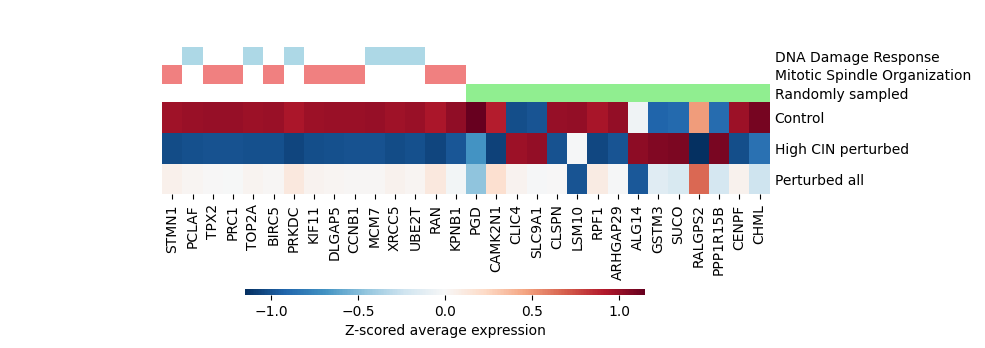

In [105]:
k = 15
X_ctl_mean = ad[ad.obs['control'].astype(bool)].X.mean(axis=0)
X_allpert_mean = ad[~ad.obs['control'].astype(bool)].X.mean(axis=0)
X_cin_mean = ad[ad.obs['Symlog group Z-scored CIN score'] > 2].X.mean(axis=0)
X_cin_low_mean = ad[ad.obs['Symlog group Z-scored CIN score'] <= 0].X.mean(axis=0)
# X = np.stack([X_ctl_mean, X_cin_low_mean, X_cin_mean, X_allpert_mean], axis=0)
X = np.stack([X_ctl_mean, X_cin_mean, X_allpert_mean], axis=0)

gene_m = ad_cin_ctl.var['gene_name'].isin(lead_genes)
gene_names_m = ad_cin_ctl[:, gene_m].var['gene_name']
gene_idxs_m = np.argsort(diff_exps)[::-1][:k]
gene_idxs_nm = np.random.choice(X_ctl_mean.shape[-1], size=k, replace=False)
X_m = X[:, gene_m]
compl_idxs = np.random.choice(np.argwhere(~gene_m).ravel(), size=gene_m.sum(), replace=False)
gene_nm = np.isin(np.arange(ad_cin_ctl.shape[-1]), compl_idxs)
X_nm = X[:, gene_nm]
gene_names_nm = ad_cin_ctl[:, gene_nm].var['gene_name'].iloc[:k]
gene_idxs_nm = np.arange(k)  # np.random.choice(gene_names_nm.sum(), size=15, replace=False)
X = np.concatenate((X_m[:, gene_idxs_m], X_nm[:, gene_idxs_nm]), axis=-1)

expression_data = pd.DataFrame(X.T, index=list(gene_names_m[gene_idxs_m]) + list(gene_names_nm[gene_idxs_nm]))
# expression_data = pd.DataFrame(zscore(X)[:, gene_idxs].T, index=gene_names[gene_idxs])

# Pathways for each gene
gene_pathways = {
    g: [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] for g in gene_names_m[gene_idxs_m]
}
for g in gene_names_nm:
    gene_pathways[g] = [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] + ['Randomly sampled']

# Assign distinct colors for each pathway
colors = ['lightblue', 'lightcoral', 'lightgreen', 'orange', 'gray']
pathway_colors = {p: colors[i] for i, p in enumerate(selected_pathways + ['Randomly sampled'])}
gene_color_matrix = pd.DataFrame(index=expression_data.index, columns=pathway_colors.keys(), data='white')
for gene, pathways in gene_pathways.items():
    for pathway in pathways:
        gene_color_matrix.loc[gene, pathway] = pathway_colors[pathway]

# Convert cell types into colors (e.g., Control=black, Perturbed=red)
cell_annotations = pd.DataFrame({
    "": ["Control", "High CIN perturbed", "Perturbed all"] # + ["Perturbed all"] * n_cells_group
}, index=expression_data.columns)
lut_cells =  {"Control": "#4D4D4D", "High CIN perturbed": "#FF6F61"}  # {"Control": "black", "Perturbed": "red"}
cell_colors = cell_annotations[""].map(lut_cells)

# Plot the heatmap with multi-colored row annotations
g = sns.clustermap(
    expression_data.T,
    z_score=True,
    cmap="RdBu_r", # cmap="RdBu_r",  # "vlag",  
    # row_colors=cell_colors,  # Multi-colored annotation
    col_colors=gene_color_matrix,
    colors_ratio=0.1,
    row_cluster=False,
    col_cluster=False,
    # cbar_pos = None,
    cbar_pos=(0.25, 0, 0.4, 0.02),  # Moves colorbar below & makes it horizontal
    cbar_kws={"orientation": "horizontal", "label": "Z-scored average expression"},  # Transposes colorbar
    # xticklabels=False,  # Removes cell labels
    # dendrogram_ratio=(0.1, 0.1),
    figsize=(10, 3),
)

# Get axis for annotation
ax = g.ax_col_dendrogram  # The axis above the heatmap
# Hide the x-axis ticks
# ax.set_xticks([])
# ax.set_yticks([])
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_xlabel("")
g.ax_heatmap.set_yticks(np.arange(len(cell_annotations)) + 0.5, cell_annotations.values.ravel(), rotation=0)
g.ax_heatmap.tick_params(axis="y", which="both", length=0)

# Also remove tick marks from row colors (pathway annotations)
g.ax_col_colors.tick_params(axis="y", which="both", length=0)
# g.ax_row_colors.tick_params(axis="x", which="both", length=0)

plt.show()

In [369]:
k = 10
selected_pathways = ['DNA Replication ',
                     'Mitotic Spindle Organization ',
]
gene_ms = []
gene_is = []
for p in selected_pathways:
    selected_res = res_allpert_res2d.set_index('Term_').loc[[p]] # res.res2d.set_index('Term_').loc[selected_pathways]
    lead_genes = np.unique(';'.join(selected_res['Lead_genes'].values).split(';'))
    gene_m = ad_cin_ctl.var['gene_name'].isin(lead_genes)
    X_ctl = ad_cin_ctl[ad_cin_ctl.obs['control'].astype(bool), gene_m].X.toarray()
    X_cin = ad_cin_ctl[~ad_cin_ctl.obs['control'].astype(bool), gene_m].X.toarray()
    diff_exps = np.abs(X_cin.mean(axis=0) - X_ctl.mean(axis=0))
    gene_idxs = np.argsort(diff_exps)[::-1][:k]
    gene_ms.append(gene_m)
    gene_is.append(gene_idxs)

In [370]:
X_ctrl = ad[ad.obs['control'].astype(bool)].X.mean(axis=0)
X_allpert_mean = ad[~ad.obs['control'].astype(bool)].X.mean(axis=0)
X_cin_mean = ad[ad.obs['Symlog group Z-scored CIN score'] > 2].X.mean(axis=0)

In [331]:
X = np.concatenate([ad[ad.obs['control'].astype(bool)].X, ad[~ad.obs['control'].astype(bool)].X, ad[ad.obs['Symlog group Z-scored CIN score'] > 2].X], axis=0)
index = np.concatenate([ad[ad.obs['control'].astype(bool)].obs.index, ad[~ad.obs['control'].astype(bool)].obs.index, ad[ad.obs['Symlog group Z-scored CIN score'] > 2].obs.index])
X_df = pd.DataFrame(X, index=index, columns=list(ad.var['gene_name']))
zscored_expression = zscore(X_df.T).T

In [358]:
index = np.concatenate([
    ['Control'] * len(ad[ad.obs['control'].astype(bool)]),
    ['Perturbed'] * len(ad[~ad.obs['control'].astype(bool)].obs.index),
    ['High CIN'] * len(ad[ad.obs['Symlog group Z-scored CIN score'] > 2].obs.index)], axis=0)
zscored_expression['index'] = index
z_expression_data = zscored_expression.groupby('index').mean()
z_expression_data_ = z_expression_data.copy()
assert np.all(ad_cin_ctl.var['gene_name'].values == z_expression_data.columns)

In [382]:
X = np.stack([X_ctl_mean, X_cin_mean, X_allpert_mean], axis=0)
expression_data = pd.DataFrame(X.T, index=list(ad.var['gene_name']))

z_expression_data = zscore(expression_data).T
dfs = []
random_dfs = []
for i, m in enumerate(gene_ms):
    dfs.append(z_expression_data.loc[:, gene_ms[i].values].iloc[:, gene_is[i]])
    gene_idxs_nm = np.random.choice(z_expression_data.shape[1], size=k, replace=False)
    random_dfs.append(z_expression_data.iloc[:, gene_idxs_nm])
z_expression_data = pd.concat(dfs, axis=1)
z_random_expression_data =  pd.concat(random_dfs, axis=1)

/tmp/ipykernel_1654354/2313438115.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("RdBu_r")


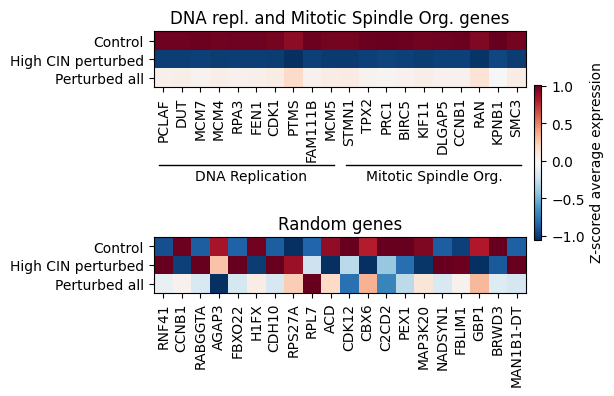

In [423]:
sns.reset_orig()
fig = plt.figure(figsize=(5, 6.5))
        
plt.subplot(2, 1, 1)
plt.title('DNA repl. and Mitotic Spindle Org. genes')
df = z_expression_data.T # .iloc[:, :k])

cmap = plt.cm.get_cmap("RdBu_r")
norm = plt.Normalize(df.iloc[2:].min().min(), df.iloc[2:].max().max())
rgba = cmap(norm(df).T)
# rgba = cmap(df)

ax = plt.gca()
ax.imshow(rgba)
# ax.set_facecolor('white')

# ax.imshow(df.values[:, :k], cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(len(df)), df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])

# Adjust bottom margin to make space for the lines
plt.subplots_adjust(bottom=0.3)

# Get figure coordinates for line placement
fig_xmin, fig_xmax = ax.get_position().xmin, ax.get_position().xmax
y_offset = 0.585  # Adjust to position lines below x-ticks

# Add horizontal lines
c = 0.01
fig.lines.append(mlines.Line2D([fig_xmin + c, fig_xmin + (k / len(df)) * (fig_xmax - fig_xmin) - 0.22], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))
fig.lines.append(mlines.Line2D([fig_xmax + 0.19 - (k / len(df)) * (fig_xmax - fig_xmin), fig_xmax - 0.04], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))

# Add text below the lines
text_offset = 0.58
c2 = 0.0
c3 = -0.02
fig.text(fig_xmin + c2 + (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, 'DNA Replication', 
         ha='center', va='top', fontsize=10)
fig.text(fig_xmax + c3 - (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, 'Mitotic Spindle Org.', 
         ha='center', va='top', fontsize=10)


plt.subplot(2, 1, 2)
plt.title('Random genes')
random_df = z_random_expression_data.T
random_rgba = cmap(norm(random_df).T)
plt.imshow(random_rgba, cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(len(random_df)), random_df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])
ax2 = plt.gca()
ax2.set_aspect('equal')

axes = [ax, plt.gca()]
cbar = fig.colorbar(im, ax=axes, orientation="vertical", fraction=0.02, pad=0.02, label='Z-scored average expression')
plt.savefig(f'{figdir}/replogleRPE1_zscores_heatmap_v2.pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1654354/299063786.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("RdBu_r")


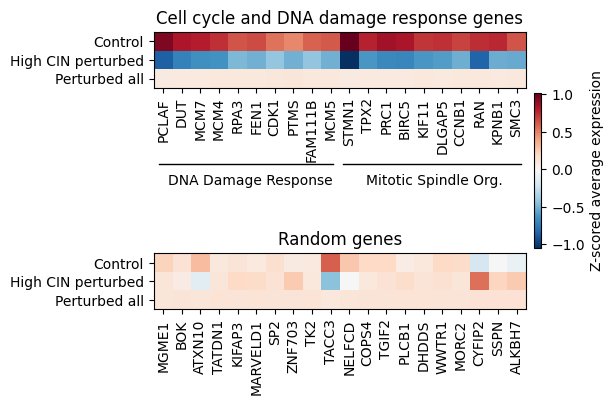

In [374]:
sns.reset_orig()
# z_expression_data = zscore(expression_data)
# z_expression_data = expression_data

fig = plt.figure(figsize=(5, 7))
        
plt.subplot(2, 1, 1)
plt.title('Cell cycle and DNA damage response genes')
df = z_expression_data.T # .iloc[:, :k])

cmap = plt.cm.get_cmap("RdBu_r")
norm = plt.Normalize(df.iloc[2:].min().min(), df.iloc[2:].max().max())
rgba = cmap(norm(df).T)
# rgba = cmap(df)

ax = plt.gca()
ax.imshow(rgba)
# ax.set_facecolor('white')

# ax.imshow(df.values[:, :k], cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(len(df)), df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])

# Adjust bottom margin to make space for the lines
plt.subplots_adjust(bottom=0.3)

# Get figure coordinates for line placement
fig_xmin, fig_xmax = ax.get_position().xmin, ax.get_position().xmax
y_offset = 0.6  # Adjust to position lines below x-ticks

# Add horizontal lines
c = 0.01
fig.lines.append(mlines.Line2D([fig_xmin + c, fig_xmin + (k / len(df)) * (fig_xmax - fig_xmin) - 0.03], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))
fig.lines.append(mlines.Line2D([fig_xmax - (k / len(df)) * (fig_xmax - fig_xmin) - 0.01, fig_xmax - 0.04], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))

# Add text below the lines
text_offset = 0.585
c2 = 0.0
c3 = -0.02
fig.text(fig_xmin + c2 + (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, 'DNA Damage Response', 
         ha='center', va='top', fontsize=10)
fig.text(fig_xmax + c3 - (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, 'Mitotic Spindle Org.', 
         ha='center', va='top', fontsize=10)


plt.subplot(2, 1, 2)
plt.title('Random genes')
random_df = z_random_expression_data.T
random_rgba = cmap(norm(random_df).T)
plt.imshow(random_rgba, cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(len(random_df)), random_df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])
ax2 = plt.gca()
ax2.set_aspect('equal')

axes = [ax, plt.gca()]
cbar = fig.colorbar(im, ax=axes, orientation="vertical", fraction=0.02, pad=0.02, label='Z-scored average expression')
# plt.tight_layout()
# plt.savefig(f'{figdir}/replogleRPE1_zscores_heatmap.pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1654354/720103297.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("RdBu_r")


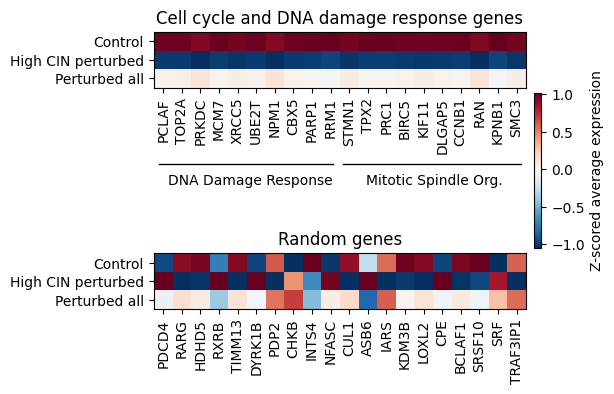

In [316]:
sns.reset_orig()
# z_expression_data = zscore(expression_data)
# z_expression_data = expression_data

fig = plt.figure(figsize=(5, 7))
        
plt.subplot(2, 1, 1)
plt.title('Cell cycle and DNA damage response genes')
df = z_expression_data.T # .iloc[:, :k])

cmap = plt.cm.get_cmap("RdBu_r")
norm = plt.Normalize(df.iloc[2:].min().min(), df.iloc[2:].max().max())
rgba = cmap(norm(df).T)
# rgba = cmap(df)

ax = plt.gca()
ax.imshow(rgba)
# ax.set_facecolor('white')

# ax.imshow(df.values[:, :k], cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(len(df)), df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])

# Adjust bottom margin to make space for the lines
plt.subplots_adjust(bottom=0.3)

# Get figure coordinates for line placement
fig_xmin, fig_xmax = ax.get_position().xmin, ax.get_position().xmax
y_offset = 0.6  # Adjust to position lines below x-ticks

# Add horizontal lines
c = 0.01
fig.lines.append(mlines.Line2D([fig_xmin + c, fig_xmin + (k / len(df)) * (fig_xmax - fig_xmin) - 0.03], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))
fig.lines.append(mlines.Line2D([fig_xmax - (k / len(df)) * (fig_xmax - fig_xmin) - 0.01, fig_xmax - 0.04], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))

# Add text below the lines
text_offset = 0.585
c2 = 0.0
c3 = -0.02
fig.text(fig_xmin + c2 + (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, 'DNA Damage Response', 
         ha='center', va='top', fontsize=10)
fig.text(fig_xmax + c3 - (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, 'Mitotic Spindle Org.', 
         ha='center', va='top', fontsize=10)


plt.subplot(2, 1, 2)
plt.title('Random genes')
random_df = z_random_expression_data.T
random_rgba = cmap(norm(random_df).T)
plt.imshow(random_rgba, cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(len(random_df)), random_df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])
ax2 = plt.gca()
ax2.set_aspect('equal')

axes = [ax, plt.gca()]
cbar = fig.colorbar(im, ax=axes, orientation="vertical", fraction=0.02, pad=0.02, label='Z-scored average expression')
# plt.tight_layout()
plt.savefig(f'{figdir}/replogleRPE1_zscores_heatmap.pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1654354/325926113.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("RdBu_r")


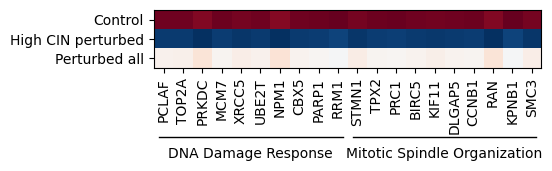

In [257]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

fig, ax = plt.subplots(figsize=(5, 2))

df = z_expression_data.T
cmap = plt.cm.get_cmap("RdBu_r")
norm = plt.Normalize(df.iloc[2:].min().min(), df.iloc[2:].max().max())
rgba = cmap(norm(df).T)

ax.imshow(rgba)

# Formatting
plt.xticks(np.arange(len(df)), df.index.values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])

# Adjust bottom margin to make space for the lines
plt.subplots_adjust(bottom=0.3)

# Get figure coordinates for line placement
fig_xmin, fig_xmax = ax.get_position().xmin, ax.get_position().xmax
y_offset = 0.1  # Adjust to position lines below x-ticks

# Add horizontal lines
c = 0.01
fig.lines.append(mlines.Line2D([fig_xmin + c, fig_xmin + (10 / len(df)) * (fig_xmax - fig_xmin) - c], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))
fig.lines.append(mlines.Line2D([fig_xmax - (10 / len(df)) * (fig_xmax - fig_xmin) + c, fig_xmax - c], 
                               [y_offset, y_offset], transform=fig.transFigure, color='black', linewidth=1))

# Add text below the lines
text_offset = 0.05
fig.text(fig_xmin + (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, selected_pathways[0][:-1], 
         ha='center', va='top', fontsize=10)
fig.text(fig_xmax - (5 / len(df)) * (fig_xmax - fig_xmin), text_offset, selected_pathways[1][:-1], 
         ha='center', va='top', fontsize=10)

plt.show()

/tmp/ipykernel_1654354/421636071.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  g: [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] for g in gene_names_m[gene_idxs_m]
/tmp/ipykernel_1654354/421636071.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("RdBu_r")
/tmp/ipykernel_1654354/421636071.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(k), gene_nam

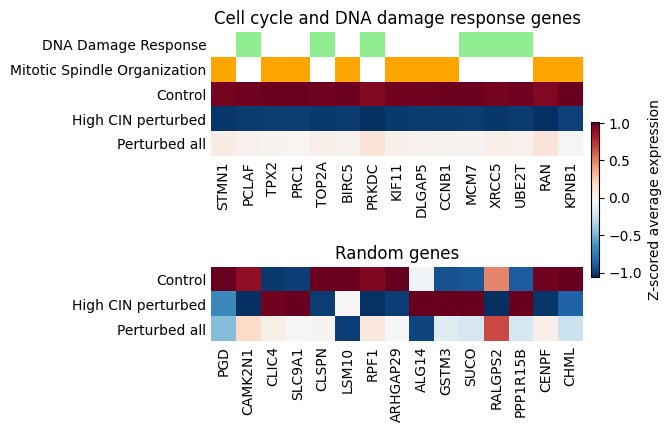

In [139]:
sns.reset_orig()
z_expression_data = zscore(expression_data)
# z_expression_data = expression_data

fig = plt.figure(figsize=(5, 5))
# Pathways for each gene
gene_pathways = {
    g: [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] for g in gene_names_m[gene_idxs_m]
}
for g in gene_names_nm:
    gene_pathways[g] = [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]]

gene_color_matrix = pd.DataFrame(index=expression_data.index, columns=selected_pathways, data=0)
for gene, pathways in gene_pathways.items():
    for pathway in pathways:
        gene_color_matrix.loc[gene, pathway] = 1
        
plt.subplot(2, 1, 1)
plt.title('Cell cycle and DNA damage response genes')
df = pd.concat((gene_color_matrix.iloc[:k].T, z_expression_data.T.iloc[:, :k]))

cmap = plt.cm.get_cmap("RdBu_r")
norm = plt.Normalize(df.iloc[2:].min().min(), df.iloc[2:].max().max())
rgba = cmap(norm(df))
# rgba = cmap(df)

colors = ['lightgreen', 'orange', 'gray']  # 'lightblue', 'lightcoral', 
for i in range(2):
    for j in range(k):
        if df.iloc[i, j] == 1:
            rgba[i, j, :3] = matplotlib.colors.to_rgb(colors[i]) # (0, 0, 0)
        else:
            rgba[i, j, :3] = matplotlib.colors.to_rgb('white')

ax = plt.gca()
im = ax.imshow(z_expression_data.T.iloc[:, :k], visible=False, cmap="RdBu_r")
ax.tick_params(axis="x", which="both", length=0)
ax.tick_params(axis="y", which="both", length=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.imshow(rgba)
ax.set_facecolor('white')

# ax.imshow(df.values[:, :k], cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(k), gene_names_m[gene_idxs_m].values, rotation=90)
plt.yticks(np.arange(5), [s[:-1] for s in selected_pathways] + ['Control', 'High CIN perturbed', 'Perturbed all'])

plt.subplot(2, 1, 2)
plt.title('Random genes')
random_rgba = cmap(norm(z_expression_data.T.iloc[:, k:]))
plt.imshow(random_rgba, cmap="RdBu_r", aspect="auto")
plt.xticks(np.arange(k), gene_names_nm[gene_idxs_nm].values, rotation=90)
plt.yticks(np.arange(3), ['Control', 'High CIN perturbed', 'Perturbed all'])
ax2 = plt.gca()
ax2.set_aspect('equal')
ax2.tick_params(axis="x", which="both", length=0)
ax2.tick_params(axis="y", which="both", length=0)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.spines['left'].set_visible(False)

axes = [ax, plt.gca()]
cbar = fig.colorbar(im, ax=axes, orientation="vertical", fraction=0.02, pad=0.02, label='Z-scored average expression')
# plt.tight_layout()
plt.savefig(f'{figdir}/replogleRPE1_zscores_heatmap.pdf', bbox_inches='tight')
plt.show()

In [694]:
X_ctl_mean = ad[ad.obs['control'].astype(bool)].X.mean(axis=0)
X_allpert_mean = ad[~ad.obs['control'].astype(bool)].X.mean(axis=0)
X_cin_mean = ad[ad.obs['Symlog group Z-scored CIN score'] > 2].X.mean(axis=0)
X = np.stack([X_ctl_mean, X_cin_mean, X_allpert_mean], axis=0)
gene_m = ad_cin_ctl.var['gene_name'].isin(lead_genes)
X = X[:, gene_nm]

/tmp/ipykernel_595296/4144970944.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expression_data = pd.DataFrame(X[:, gene_idxs].T, index=gene_names[gene_idxs])
/tmp/ipykernel_595296/4144970944.py:15: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'lightblue' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  gene_color_matrix.loc[gene, pathway] = pathway_colors[pathway]
/tmp/ipykernel_595296/4144970944.py:15: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'lightcoral' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  gene_color_matrix.loc[gene, pathway] = pat

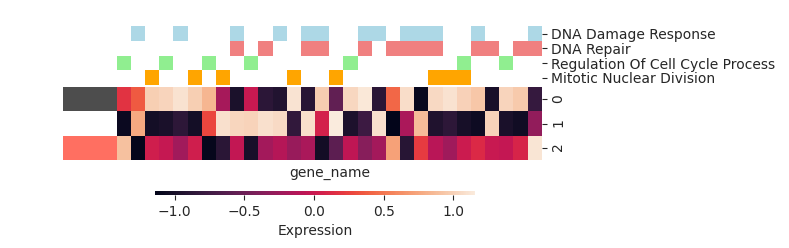

In [253]:
expression_data = pd.DataFrame(X[:, gene_idxs].T, index=gene_names[gene_idxs])
# expression_data = pd.DataFrame(zscore(X)[:, gene_idxs].T, index=gene_names[gene_idxs])

# Pathways for each gene
gene_pathways = {
    g: [p for p, lg in pd.DataFrame(selected_res['Lead_genes']).iterrows() if g in lg.values[0]] for g in gene_names
}

# Assign distinct colors for each pathway
colors = ['lightblue', 'lightcoral', 'lightgreen', 'orange']
pathway_colors = {p: colors[i] for i, p in enumerate(selected_pathways)}
gene_color_matrix = pd.DataFrame(index=expression_data.index, columns=pathway_colors.keys(), data=np.nan)
for gene, pathways in gene_pathways.items():
    for pathway in pathways:
        gene_color_matrix.loc[gene, pathway] = pathway_colors[pathway]

# Convert cell types into colors (e.g., Control=black, Perturbed=red)
cell_annotations = pd.DataFrame({
    "": ["Control", "All perturbations", "High CIN perturbed"] # + ["Perturbed all"] * n_cells_group
}, index=expression_data.columns)
lut_cells =  {"Control": "#4D4D4D", "High CIN perturbed": "#FF6F61"}  # {"Control": "black", "Perturbed": "red"}
cell_colors = cell_annotations[""].map(lut_cells)

# Plot the heatmap with multi-colored row annotations
g = sns.clustermap(
    expression_data.T,
    z_score=True,
    # cmap="RdBu_r",  # "vlag",  
    row_colors=cell_colors,  # Multi-colored annotation
    col_colors=gene_color_matrix,
    colors_ratio=0.1,
    row_cluster=False,
    col_cluster=False,
    # cbar_pos = None,
    cbar_pos=(0.2, 0, 0.4, 0.02),  # Moves colorbar below & makes it horizontal
    cbar_kws={"orientation": "horizontal", "label": "Expression"},  # Transposes colorbar
    xticklabels=False,  # Removes cell labels
    dendrogram_ratio=(0.1, 0.1),
    figsize=(8, 2),
)
plt.show()

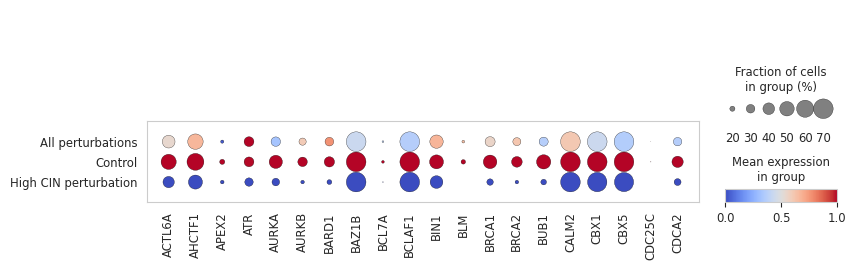

In [178]:
sc.pl.dotplot(
    ad_ss, 
    var_names=lead_genes[:20], 
    groupby='type', 
    standard_scale="var",  # Normalize expression values per gene
    cmap="coolwarm",  # Color scale
    dot_max=0.7,  # Adjust dot scaling
    dot_min=0.1,  # Minimum dot size
)

#### Volcano plots

In [459]:
df = ad.to_df().T
df.index = ad.var.loc[df.index]['gene_name']
res_allpert = gp.gsea(data=df.reset_index(), # row -> genes, column-> samples
        gene_sets="GO_Biological_Process_2023",
        cls=ad.obs['control'].values,
        permutation_num=500,
        permutation_type='phenotype',
        min_size=5,
        # max_size=1000,
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
res_allpert.res2d['Term_'] = res_allpert.res2d['Term'].str.split('(').str[0]
res_allpert.res2d['Gene % compl'] = 100 - res_allpert.res2d['Gene %'].str.split('%').str[0].astype(float)
# res_allpert.res2d.to_csv(f'{outdir}/replogleRPE1_gsea_bp.csv')

2025-03-20 12:00:39,365 [WARNING] Found duplicated gene names, values averaged by gene names!
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/base.py:230: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby(level=0).mean()
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/gsea.py:105: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  df_std = df.groupby(by=cls_dict, axis=1).std(numeric_only=True)


In [424]:
res_allpert_res2d = pd.read_csv(f'{outdir}/replogleRPE1_gsea_bp.csv', index_col=0)
res_ = res_allpert_res2d.copy()
res_

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,Term_
0,gsea,DNA Metabolic Process (GO:0006259),-0.695567,-2.626295,0.000000,0.000000,0.0,105/179,18.69%,HMGB1;PCLAF;TYMS;PTGES3;DUT;NPM1;RAN;MCM7;XRCC...,DNA Metabolic Process
1,gsea,mRNA Processing (GO:0006397),-0.669517,-2.590942,0.000000,0.000000,0.0,69/135,19.17%,HNRNPA2B1;SRSF2;SRSF7;SRSF3;HNRNPA1;HNRNPC;HNR...,mRNA Processing
2,gsea,"RNA Splicing, Via Transesterification Reaction...",-0.687997,-2.587179,0.000000,0.000000,0.0,63/116,19.17%,HNRNPA2B1;SRSF2;SRSF7;SRSF3;HNRNPA1;HNRNPC;HNR...,"RNA Splicing, Via Transesterification Reaction..."
3,gsea,DNA Repair (GO:0006281),-0.635530,-2.542736,0.000000,0.000000,0.0,93/164,23.53%,NPM1;NUCKS1;XRCC5;UBE2T;PRKDC;RRM1;PARP1;SMC1A...,DNA Repair
4,gsea,"mRNA Splicing, Via Spliceosome (GO:0000398)",-0.657591,-2.522191,0.000000,0.000000,0.0,68/136,19.17%,HNRNPA2B1;SRSF2;SRSF7;SRSF3;HNRNPA1;HNRNPC;HNR...,"mRNA Splicing, Via Spliceosome"
...,...,...,...,...,...,...,...,...,...,...,...
2997,gsea,Receptor Catabolic Process (GO:0032801),0.207919,0.452902,0.984314,0.996866,1.0,4/6,32.43%,LGMN;UVRAG;SMURF1;SNX25,Receptor Catabolic Process
2998,gsea,Regulation Of Macrophage Differentiation (GO:0...,0.208132,0.450072,0.996212,0.996457,1.0,4/6,43.84%,INHBA;LIF;ID2;CSF1,Regulation Of Macrophage Differentiation
2999,gsea,Fat Cell Differentiation (GO:0045444),-0.142456,-0.447997,0.996032,0.996473,1.0,10/20,47.90%,GDF6;HMGA2;PPARG;SMAD6;SIRT1;ERAP1;BSCL2;ATF5;...,Fat Cell Differentiation
3000,gsea,Cortical Actin Cytoskeleton Organization (GO:0...,-0.178776,-0.445886,1.000000,0.996110,1.0,10/10,89.10%,ROCK2;FHOD1;FMNL3;FMNL2;DLG1;STRIP1;NCKAP1;FHO...,Cortical Actin Cytoskeleton Organization


/home/vinas/sc_perturbation_benchmark/analysis/plot_utils.py:954: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # df = df.sort_values(by=self.colname)


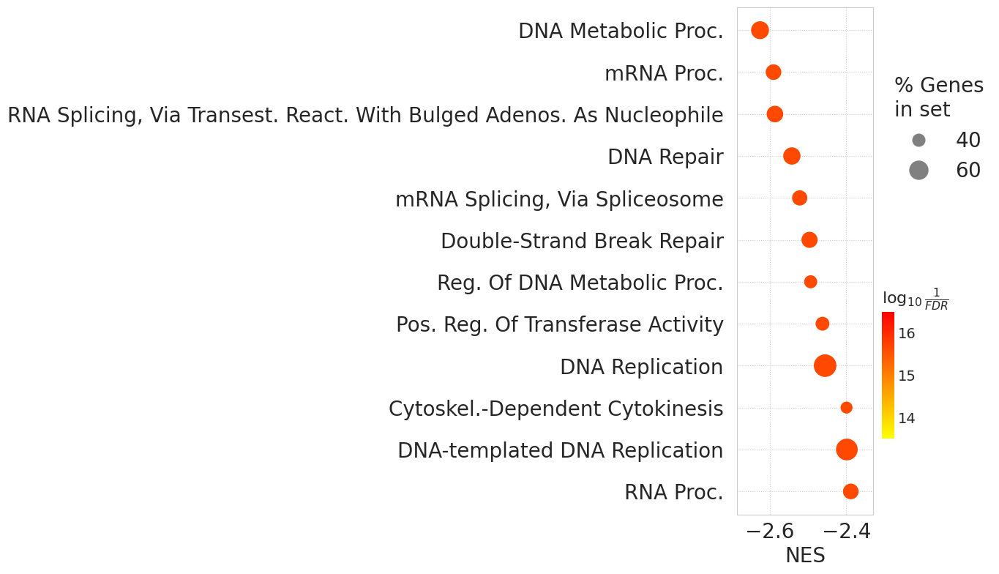

In [427]:
fontsize = 20
sns.set_style('whitegrid')
res_['FDR q-val'] = res_['FDR q-val'].astype(float)
res_['n_pathway_genes'] = res_['Tag %'].str.split('/').str[1].astype(int)
res_['Term'] = res_['Term'].str.split('(').str[0]
res_['Term'] = res_['Term'].str.replace('Positive', 'Pos.').str.replace('Processing', 'Proc.').str.replace('Regulation', 'Reg.').str.replace('Process', 'Proc.').str.replace('Segregation', 'Segr.').str.replace('Cytoskeleton', 'Cytoskel.')
res_['Term'] = res_['Term'].str.replace('Transesterification', 'Transest.').str.replace('Reactions', 'React.').str.replace('Adenosine', 'Adenos.').str.replace('React.s', 'React.')
ax = dotplot(res_,
             x='NES',
             column='FDR q-val',
             figsize=(3, 9),
             show_ring=False,
             size=5,
             top_term=12,
             cmap = plt.cm.autumn_r)
plt.yticks(fontsize=fontsize);
plt.xticks(fontsize=fontsize);
plt.title('', fontsize=18);
plt.grid(linestyle='dotted')
plt.savefig(f'{figdir}/replogle_all_rpe1_top_pathway_enrichment_abrv.pdf', bbox_inches='tight');
plt.show()

In [365]:
pvals = []
X = ad.X
X_ctl = X[ad.obs['control'].astype(bool)]
X_pert = X[~ad.obs['control'].astype(bool)]
for i in tqdm(range(adata.shape[-1])):
    t_statistic, p_values = stats.ttest_ind(X_pert[:, i], X_ctl[:, i])
    pvals.append(p_values)
pvals = np.array(pvals)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 5811/5811 [00:58<00:00, 99.12it/s]


In [393]:
X = ad.X
X_ctl = X[ad.obs['control'].astype(bool)]
X_pert = X[~ad.obs['control'].astype(bool)]

/tmp/ipykernel_1654354/3621015825.py:20: RuntimeWarning: divide by zero encountered in log10
  y = -np.log10(pvals + eps)
posx and posy should be finite values
posx and posy should be finite values
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/matplotlib/transforms.py:360: RuntimeWarning: invalid value encountered in scalar subtract
  return points[1, 1] - points[0, 1]
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


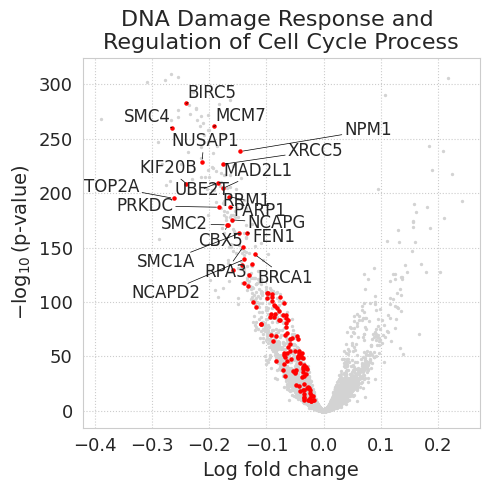

In [489]:
fontsize=14
eps = 1e-520
k = 23

sns.set_style('whitegrid')
res_df = res_allpert_res2d.copy()  # res_.copy()
res_df['n_pathway_genes'] = res_df['Tag %'].str.split('/').str[0].astype(int)
res_df['Term'] = res_df['Term'].str.split('(').str[0].str[:-1]

terms = ['DNA Damage Response', 'Positive Regulation Of Cell Cycle Process']
idxs = res_df[res_df['Term'].isin(terms)].index
rows = res_df.loc[idxs]
lead_genes = []
for _, row in rows.iterrows():
    lead_genes.extend(list(row['Lead_genes'].split(';')))

x = X_pert.mean(0) - X_ctl.mean(0)
y = -np.log10(pvals + eps)
gene_names = adata.var['gene_name']
res_ = res_df
res_['Term'] = res_['Term'].str.split('(').str[0]

fig = plt.figure(figsize=(5, 5))
row = res_.loc[idx]
selected_genes = lead_genes
m = gene_names.isin(selected_genes)
idxs = np.argwhere(m).ravel()

plt.title('DNA Damage Response and \nRegulation of Cell Cycle Process', fontsize=fontsize+2)
plt.scatter(x[~m], y[~m], s=2, c='lightgray')
plt.scatter(x[m], y[m], s=5, c='red')
# plt.xlabel('Average expression')
plt.xlabel('Log fold change', fontsize=fontsize)
plt.ylabel('$-\log_{10}$(p-value)', fontsize=fontsize)
plt.xticks(fontsize=fontsize-1);
plt.yticks(fontsize=fontsize-1);
plt.grid(linestyle='dotted')

texts = []
sorted_idxs = np.argsort(pvals[m])
top_genes = gene_names[m].iloc[sorted_idxs[:k]].values
for i in idxs:
    txt = gene_names.values[i]
    if txt in top_genes:
        texts.append(plt.text(x[i], y[i], txt, fontsize=fontsize-2))
adjust_text(texts, arrowprops=dict(arrowstyle="-", color='black', lw=0.5), expand_text=(1.05, 1.4), force_text=(0.1, 0.25))
    
plt.tight_layout()
plt.savefig(f'{figdir}/replogleRPE1_volcano_dnadamagecellcycle.pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1654354/2017164709.py:22: RuntimeWarning: divide by zero encountered in log10
  y = -np.log10(pvals + eps)
posx and posy should be finite values
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/matplotlib/transforms.py:360: RuntimeWarning: invalid value encountered in scalar subtract
  return points[1, 1] - points[0, 1]
posx and posy should be finite values
posx and posy should be finite values
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/matplotlib/transforms.py:360: RuntimeWarning: invalid value encountered in scalar subtract
  return points[1, 1] - points[0, 1]
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and

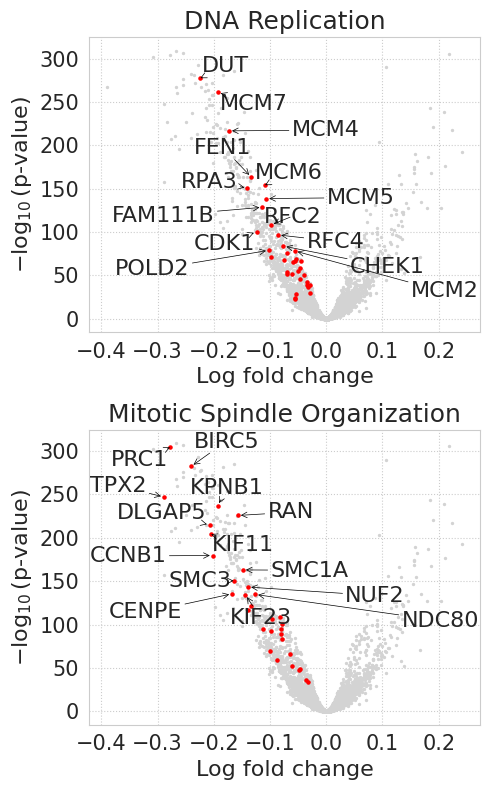

In [395]:
# res_df = res.res2d.copy()
sns.set_style('whitegrid')
res_df = res_allpert_res2d.copy()  # res_.copy()
res_df['n_pathway_genes'] = res_df['Tag %'].str.split('/').str[0].astype(int)
res_df['Term'] = res_df['Term'].str.split('(').str[0].str[:-1]

# 'DNA Duplex Unwinding '
# idx = res_df[res_df['Term'] == 'Regulation Of Cell Cycle Process'].index[0]
terms = ['DNA Replication', 'Mitotic Spindle Organization']
# idx = res_df[res_df['Term'] == 'Mitotic Spindle Organization'].index[0]
# idx = res_df[res_df['Term'] == 'DNA Damage Response'].index[0]
# idx = res_df[res_df['Term'] == 'Double-Strand Break Repair'].index[0]
idxs = res_df[res_df['Term'].isin(terms)].index

nrows = 2
ncols = 1
fontsize=16
eps = 1e-520
k = 15

x = X_pert.mean(0) - X_ctl.mean(0)
y = -np.log10(pvals + eps)
gene_names = adata.var['gene_name']
res_ = res_df # res.res2d.copy()
res_['Term'] = res_['Term'].str.split('(').str[0]

fig = plt.figure(figsize=(ncols*5, nrows*4))
for i, idx in enumerate(idxs):
    row = res_.loc[idx]
    plt.subplot(nrows, ncols, i+1)
    # letter_annotation(plt.gca(), -.1, 1, chr(97 + i), fontsize=14)
    # volcano_plot(x, y, row, gene_names, fontsize=fontsize)
    selected_genes = row['Lead_genes'].split(';')
    m = gene_names.isin(selected_genes)
    idxs = np.argwhere(m).ravel()
    
    plt.title(row['Term'], fontsize=fontsize+2)
    plt.scatter(x[~m], y[~m], s=2, c='lightgray')
    plt.scatter(x[m], y[m], s=5, c='red')
    # plt.xlabel('Average expression')
    plt.xlabel('Log fold change', fontsize=fontsize)
    plt.ylabel('$-\log_{10}$(p-value)', fontsize=fontsize)
    plt.xticks(fontsize=fontsize-1);
    plt.yticks(fontsize=fontsize-1);
    plt.grid(linestyle='dotted')
    
    texts = []
    sorted_idxs = np.argsort(pvals[m])
    top_genes = gene_names[m].iloc[sorted_idxs[:k]].values
    for i in idxs:
        txt = gene_names.values[i]
        if txt in top_genes:
            texts.append(plt.text(x[i], y[i], txt, fontsize=fontsize))
    adjust_text(texts, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    
plt.tight_layout()
plt.savefig(f'{figdir}/replogleRPE1_volcano_combined.pdf', bbox_inches='tight')
plt.savefig(f'{figdir}/replogleRPE1_volcano_combined.png', bbox_inches='tight', dpi=1200);
plt.show()

#### DE genes

In [494]:
res_ = res_df

m = np.isnan(pvals)
pvals_ = pvals[~m]
gene_names_ = gene_names[~m]
top_genes = gene_names_[pvals_ < 0.05].values

df_ = res_.head(10)[['Term', 'Lead_genes']]
df_['Gene_set'] = df_['Lead_genes'].apply(lambda x: set([y for y in x.split(';') if y in top_genes]))
df_['Term'] =  df_['Term'].str.split('(').str[0]

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/upsetplot/data.py:303: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.fillna(False, inplace=True)
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/upsetplot/plotting.py:795: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  styles["linewidth"]

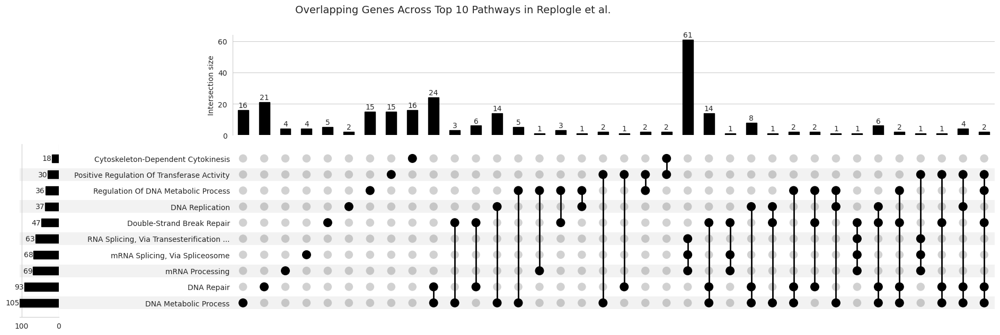

In [500]:
# Create a mapping from gene to pathways it appears in
gene_to_pathways = defaultdict(set)
for idx, row in df_.iterrows():
    for gene in row['Gene_set']:
        term = row['Term']
        if 'Transesterification' in term:
            term = term.split('Reactions')[0] + '...'
        gene_to_pathways[gene].add(term)

# Build memberships (i.e., which pathways each gene is part of)
memberships = [tuple(sorted(list(gene_to_pathways[gene]))) for gene in gene_to_pathways]

# Build and plot the UpSet plot
upset_data = from_memberships(memberships)
UpSet(upset_data, subset_size='count', show_counts=True).plot()

# Adjust spacing to make room for left labels and bars
plt.subplots_adjust(left=0.1, bottom=0.15, top=0.9, right=1)

plt.suptitle("Overlapping Genes Across Top 10 Pathways in Replogle et al.", fontsize=14)
plt.tight_layout()
plt.savefig(f'{figdir}/upset_replogleRPE1_top10pathways.pdf', bbox_inches='tight');
plt.show()

In [501]:
for idx, row in df_.iterrows():
    print(row['Term'], '&', ', '.join(row['Gene_set']), '\\\\')

DNA Metabolic Process & DUT, MRE11, FANCG, RAD51AP1, POLD3, RFC3, RAN, HPF1, TOP2A, RPA3, POLQ, RMI2, CENPS, NTHL1, MSH6, PDS5A, NUDT1, XRCC5, DONSON, PDS5B, PRKDC, RFC5, RMI1, CHEK1, SMC1A, ORC1, TDP1, RAD21, POLE3, UBE2T, NPM1, CDC45, MCM4, SMARCA5, FANCL, SMARCB1, NSMCE4A, TOPBP1, TYMS, FEN1, KPNA2, RBBP8, RRM1, HLTF, BLM, PARP1, NEIL3, PRIM2, FAM111A, ACTL6A, UBE2N, DNA2, DCTPP1, UCHL5, BARD1, HMGB2, BRCA1, RFC2, POLA1, POLD2, MCM6, WDHD1, NUDT15, EXO1, LIG1, XRCC6, XRCC2, HMGB1, HMGB3, MCM2, MCRS1, NOC3L, MCM3, PTMS, MCM5, FAM111B, RFC4, MCM8, MCM10, RAD18, TIMELESS, TOP2B, ORC6, MSH2, RPA2, PARP2, POLE2, RECQL, RUVBL1, UNG, POLA2, TOP1, GEN1, CDK1, POLD1, MCM7, PRIM1, GTF2H3, FANCA, RAD51, PTGES3, CDK2, EP400, PCLAF, POLE \\
mRNA Processing & GEMIN5, GEMIN6, MAGOHB, SNRNP35, TRA2B, SRRM1, HNRNPA3, SNRNP200, SRSF6, RNPS1, SNRPE, LSM5, PPIH, DDX39A, SRSF2, CDC5L, SRSF1, ALYREF, CPSF3, HNRNPA1, DDX5, SRSF3, LSM2, DHX15, LSM6, SRSF10, LSM3, DDX46, SRSF4, SNRPB, RBMX, SNRPG, HSPA8, HN

In [817]:
X_ctl_mean = ad[ad.obs['control'].astype(bool)].X.mean(axis=0)
X_allpert_mean = ad[~ad.obs['control'].astype(bool)].X.mean(axis=0)
X_cin_mean = ad[ad.obs['Symlog group Z-scored CIN score'] > 2].X.mean(axis=0)
X_pert_all = ad[~ad.obs['control'].astype(bool)].X.toarray()
X_pert_all_m = ad[~ad.obs['control'].astype(bool), gene_m].X.toarray()

In [745]:
out_cin = count_higher(X_cin, X_ctl)
out_allpert = count_higher(X_pert_all[np.random.choice(len(X_pert_all), size=len(X_cin))], X_ctl)

In [743]:
compl_idxs = np.random.choice(np.argwhere(~gene_m).ravel(), size=gene_m.sum(), replace=False)
gene_nm = np.isin(np.arange(ad_cin_ctl.shape[-1]), compl_idxs)
gene_nm.sum()

177

In [882]:
compl_idxs = np.random.choice(np.argwhere(~gene_m).ravel(), size=gene_m.sum(), replace=False)
gene_nm = np.isin(np.arange(ad_cin_ctl.shape[-1]), compl_idxs)
X_ctl_nm = ad_cin_ctl[ad_cin_ctl.obs['control'].astype(bool), gene_nm].X.toarray()
X_cin_nm = ad_cin_ctl[~ad_cin_ctl.obs['control'].astype(bool), gene_nm].X.toarray()
X_pert_all_nm = ad[~ad.obs['control'].astype(bool), gene_nm].X.toarray()

In [747]:
total_combinations = (X_cin.shape[0] * X_ctl.shape[0])
expected = total_combinations/2
means_cin = out_cin / total_combinations
means_allpert = out_allpert / total_combinations

means_cin_subset = means_cin[gene_idxs]
means_allpert_subset = means_allpert[gene_idxs]

In [ ]:
out_cin_random = count_higher(X_cin_nm, X_ctl_nm)
out_allpert_random = count_higher(X_pert_all_nm[np.random.choice(len(X_pert_all_nm), size=len(X_cin_nm))], X_ctl_nm)

total_combinations_random = (X_cin_nm.shape[0] * X_ctl_nm.shape[0])
means_cin_random = out_cin_random / total_combinations_random
means_allpert_random = out_allpert_random / total_combinations_random

means_cin_random_subset = means_cin_random[gene_idxs]
means_allpert_random_subset = means_allpert_random[gene_idxs]

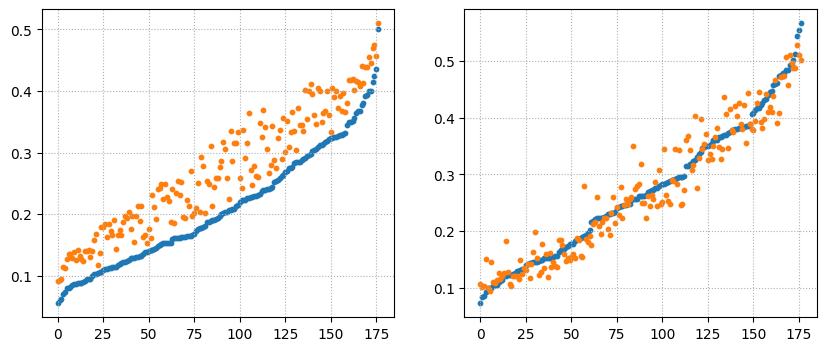

In [759]:
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sorted_idxs = np.argsort(means_cin)
plt.scatter(np.arange(len(means_cin)), means_cin[sorted_idxs], s=10)
plt.scatter(np.arange(len(means_allpert)), means_allpert[sorted_idxs], s=10)
plt.grid(linestyle='dotted')

plt.subplot(1, 2, 2)
sorted_idxs = np.argsort(means_cin_random)
plt.scatter(np.arange(len(means_cin_random)), means_cin_random[sorted_idxs], s=10)
plt.scatter(np.arange(len(means_allpert_random)), means_allpert_random[sorted_idxs], s=10)
plt.grid(linestyle='dotted')
plt.show()

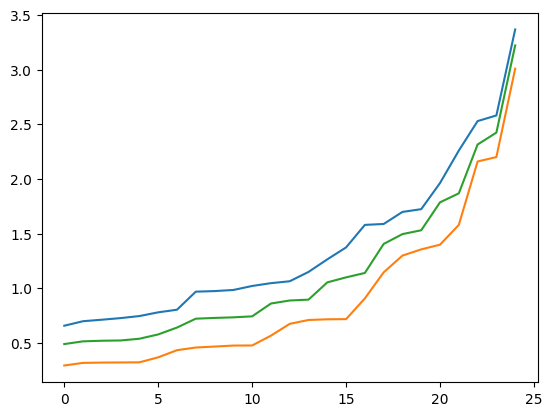

In [808]:
sort_idxs = np.argsort(X_ctl_mean[gene_m][gene_idxs])
plt.plot(np.arange(len(sort_idxs)), X_ctl_mean[gene_m][gene_idxs][sort_idxs])
# sort_idxs = np.argsort(X_cin_low_mean[gene_m])
# plt.plot(np.arange(len(sort_idxs)), X_cin_low_mean[gene_m][sort_idxs])
sort_idxs = np.argsort(X_cin_mean[gene_m][gene_idxs])
plt.plot(np.arange(len(sort_idxs)), X_cin_mean[gene_m][gene_idxs][sort_idxs])
sort_idxs = np.argsort(X_pert_all.mean(axis=0)[gene_m][gene_idxs])
plt.plot(np.arange(len(sort_idxs)), X_pert_all.mean(axis=0)[gene_m][gene_idxs][sort_idxs])
plt.show()

In [836]:
selected_pathways = [# 'DNA Damage Response ',
                     # 'DNA Repair ',
                     # 'Regulation Of Cell Cycle Process ',
                     'Mitotic Spindle Organization ',
                     # 'Mitotic Nuclear Division '
]
selected_res = res.res2d.set_index('Term_').loc[selected_pathways]
lead_genes = np.unique(';'.join(selected_res['Lead_genes'].values).split(';'))
lead_genes

gene_m = ad_cin_ctl.var['gene_name'].isin(lead_genes)
gene_m.sum()

33

In [875]:
k = 15
diff_exps = np.abs(X_pert_all.mean(axis=0)[gene_m] - X_ctl_mean[gene_m])
g_idxs = np.argsort(diff_exps)[::-1][:k]

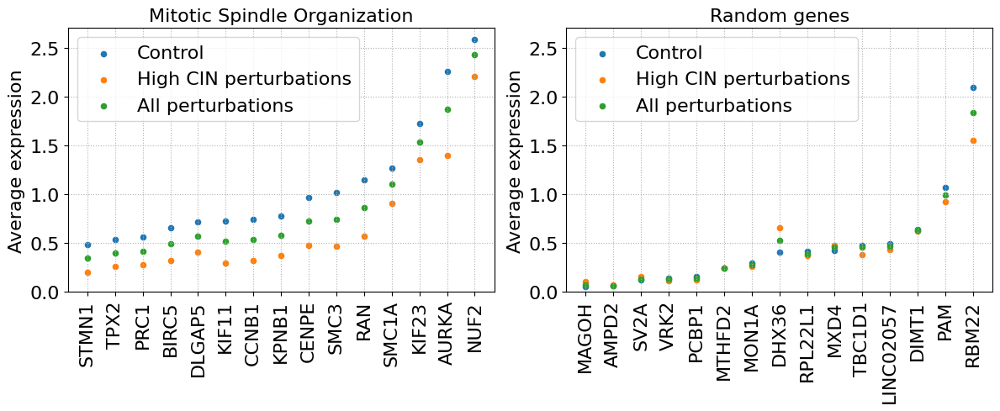

In [928]:
s=20
fontsize=16
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title('Mitotic Spindle Organization', fontsize=fontsize)
sort_idxs = np.argsort(X_ctl_mean[gene_m][g_idxs])
plt.scatter(np.arange(k), X_ctl_mean[gene_m][g_idxs][sort_idxs], s=s, label='Control')
plt.scatter(np.arange(k), X_cin_mean[gene_m][g_idxs][sort_idxs], s=s, label='High CIN perturbations')
plt.scatter(np.arange(k), X_pert_all.mean(axis=0)[gene_m][g_idxs][sort_idxs], s=s, label='All perturbations')
plt.grid(linestyle='dotted')
plt.xticks(np.arange(k), ad_cin_ctl.var['gene_name'][gene_m].astype(str).values[g_idxs], rotation=90, fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Average expression', fontsize=fontsize)
plt.ylim((0, 2.7))
plt.legend(fontsize=fontsize)

plt.subplot(1, 2, 2)
plt.title('Random genes', fontsize=fontsize)
sort_idxs = np.argsort(X_ctl_mean[gene_nm][:k])
plt.scatter(np.arange(len(sort_idxs)), X_ctl_mean[gene_nm][:k][sort_idxs], s=s, label='Control')
plt.scatter(np.arange(len(sort_idxs)), X_cin_mean[gene_nm][:k][sort_idxs], s=s, label='High CIN perturbations')
plt.scatter(np.arange(len(sort_idxs)), X_pert_all.mean(axis=0)[gene_nm][:k][sort_idxs], s=s, label='All perturbations')
plt.grid(linestyle='dotted')
plt.xticks(np.arange(k), ad_cin_ctl.var['gene_name'][gene_nm].astype(str).values[:k], rotation=90, fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Average expression', fontsize=fontsize)
plt.ylim((0, 2.7))
plt.legend(fontsize=fontsize)
plt.tight_layout()
plt.savefig(f'{figdir}/replogleRPE1_top_mitotic_genes.pdf', bbox_inches='tight');
plt.show()

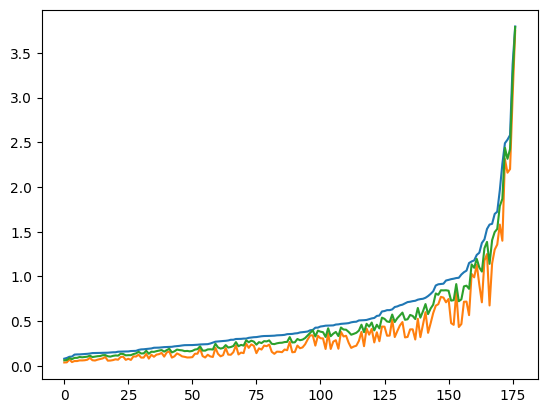

In [802]:
sort_idxs = np.argsort(X_ctl_mean[gene_m])
plt.plot(np.arange(len(sort_idxs)), X_ctl_mean[gene_m][sort_idxs])
# sort_idxs = np.argsort(X_cin_low_mean[gene_m])
# plt.plot(np.arange(len(sort_idxs)), X_cin_low_mean[gene_m][sort_idxs])
# sort_idxs = np.argsort(X_cin_mean[gene_m])
plt.plot(np.arange(len(sort_idxs)), X_cin_mean[gene_m][sort_idxs])
# sort_idxs = np.argsort(X_pert_all.mean(axis=0)[gene_m])
plt.plot(np.arange(len(sort_idxs)), X_pert_all.mean(axis=0)[gene_m][sort_idxs])
plt.show()

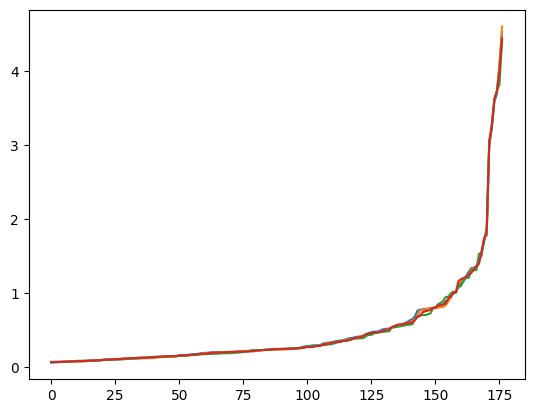

In [799]:
sort_idxs = np.argsort(X_ctl_mean[gene_nm])
plt.plot(np.arange(len(sort_idxs)), X_ctl_mean[gene_nm][sort_idxs])
sort_idxs = np.argsort(X_cin_low_mean[gene_nm])
plt.plot(np.arange(len(sort_idxs)), X_cin_low_mean[gene_nm][sort_idxs])
sort_idxs = np.argsort(X_cin_mean[gene_nm])
plt.plot(np.arange(len(sort_idxs)), X_cin_mean[gene_nm][sort_idxs])
sort_idxs = np.argsort(X_pert_all.mean(axis=0)[gene_nm])
plt.plot(np.arange(len(sort_idxs)), X_pert_all.mean(axis=0)[gene_nm][sort_idxs])
plt.show()

In [ ]:
X_pert_all.mean(axis=0)[gene_m]

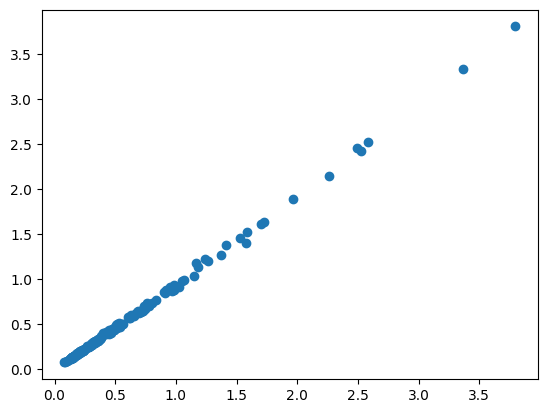

In [778]:
plt.scatter(X_ctl_mean[gene_m], X_cin_low_mean[gene_m])
plt.show()

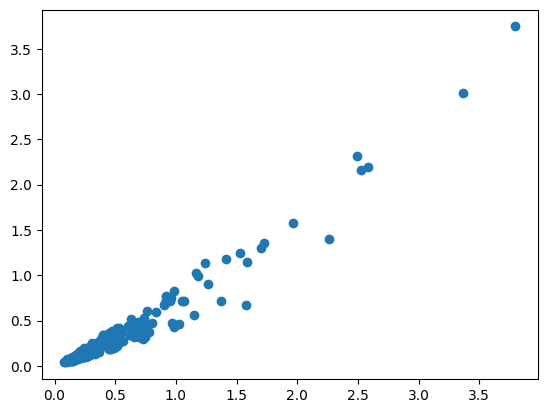

In [781]:
plt.scatter(X_ctl_mean[gene_m], X_cin_mean[gene_m])
plt.show()

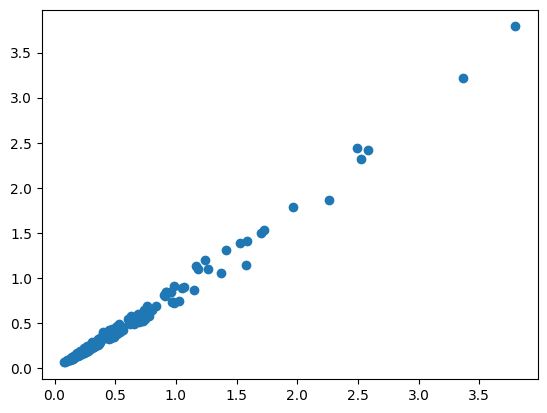

In [786]:
plt.scatter(X_ctl_mean[gene_m], X_pert_all.mean(axis=0)[gene_m])
plt.show()

In [772]:
(X_cin_low_mean > X_ctl_mean)[gene_m].sum()

3

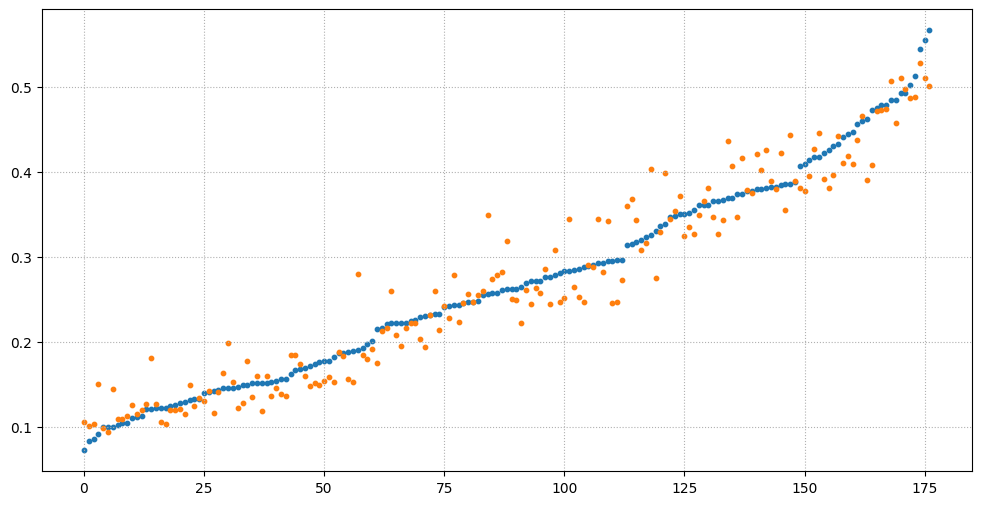

In [750]:
plt.figure(figsize=(12, 6))
sorted_idxs = np.argsort(means_cin_random)
plt.scatter(np.arange(len(means_cin_random)), means_cin_random[sorted_idxs], s=10)
plt.scatter(np.arange(len(means_allpert_random)), means_allpert_random[sorted_idxs], s=10)
plt.grid(linestyle='dotted')
plt.show()

In [ ]:
from scipy.cluster.hierarchy import linkage, leaves_list

# Split data by condition
control_cells = expression_data[cell_annotations[cell_annotations.values == "Control"].index]
perturbed_cells = expression_data[cell_annotations[cell_annotations.values == "Perturbed"].index]

# Cluster within each condition separately
control_linkage = linkage(control_cells.T, method="average")  # Hierarchical clustering for control
perturbed_linkage = linkage(perturbed_cells.T, method="average")  # Hierarchical clustering for perturbed

# Get new cell order within each condition
control_order = control_cells.columns[leaves_list(control_linkage)]
perturbed_order = perturbed_cells.columns[leaves_list(perturbed_linkage)]

# Concatenate the reordered cells
new_order = list(control_order) + list(perturbed_order)
reordered_expression = expression_data[new_order]  # Apply new order

In [700]:
fontsize = 12
res_ = res.res2d.copy()
# res_ = pd.read_csv(f'{outdir}/{dataset}_gsea_bp.csv')
res_['Term'] = res_['Term'].str.split('(').str[0]
ax = gp.dotplot(res_,
           column='FDR q-val',
           figsize=(3,5),
           title="",
           show_ring=False,
           size=3,
           top_term=11,
           cmap = plt.cm.autumn_r)
# letter_annotation(ax, -2, 1, 'a', fontsize=14)
plt.yticks(fontsize=fontsize);
plt.xticks(fontsize=fontsize);
plt.xlabel('NES', fontsize=14);
plt.title('Top enriched pathways', fontsize=12);
# plt.savefig(f'{figdir}/{dataset}_top_pathway_enrichment_fd.pdf', bbox_inches='tight');

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


In [706]:
ad.obs['Group Z-scored CIN score']

cell_barcode
AAACCCAAGAAACTAC-53    1.440630e-01
AAACCCAAGAATCGAT-43   -2.148130e-02
AAACCCAAGACAGCGT-52   -8.949686e-02
AAACCCAAGACATCAA-1     6.160581e-02
AAACCCAAGACCTTTG-8     1.077885e+00
                           ...     
TTTGTTGTCTGACAGT-14    1.950916e+00
TTTGTTGTCTGATGGT-14   -2.273431e-01
TTTGTTGTCTGCACCT-44    9.935359e-01
TTTGTTGTCTTGGTCC-17    1.451858e-01
TTTGTTGTCTTTCCGG-22    6.593017e-16
Name: Group Z-scored CIN score, Length: 147295, dtype: float64

In [702]:
res_[res_['FWER p-val'] < 0.05]

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,gsea,DNA Metabolic Process,-0.695763,-2.648622,0.0,0.0,0.0,105/179,18.69%,HMGB1;PCLAF;TYMS;PTGES3;DUT;NPM1;RAN;MCM7;XRCC...
1,gsea,mRNA Processing,-0.669215,-2.530066,0.0,0.0,0.0,69/135,19.19%,HNRNPA2B1;SRSF2;SRSF7;SRSF3;HNRNPA1;HNRNPC;HNR...
2,gsea,DNA Repair,-0.635384,-2.521886,0.0,0.0,0.0,93/164,23.60%,NPM1;NUCKS1;XRCC5;UBE2T;PRKDC;RRM1;PARP1;SMC1A...
3,gsea,"mRNA Splicing, Via Spliceosome",-0.657306,-2.515782,0.0,0.0,0.0,68/136,19.19%,HNRNPA2B1;SRSF2;SRSF7;SRSF3;HNRNPA1;HNRNPC;HNR...
4,gsea,"RNA Splicing, Via Transesterification Reaction...",-0.687716,-2.509873,0.0,0.0,0.0,63/116,19.19%,HNRNPA2B1;SRSF2;SRSF7;SRSF3;HNRNPA1;HNRNPC;HNR...
...,...,...,...,...,...,...,...,...,...,...
70,gsea,Nucleosome Assembly,-0.705866,-2.122142,0.0,0.000798,0.044,14/27,12.99%,NASP;DNAJC9;NPM1;HMGB2;SSRP1;SUPT16H;HAT1;CHAF...
71,gsea,Positive Regulation Of Telomere Maintenance Vi...,-0.722676,-2.121197,0.0,0.000819,0.046,11/22,12.17%,HNRNPA1;XRCC5;CCT5;CCT2;AURKB;TCP1;NEK2;CCT3;C...
72,gsea,mRNA Stabilization,-0.71053,-2.119717,0.0,0.000807,0.046,10/22,7.95%,HNRNPD;HNRNPC;FUS;HNRNPU;THRAP3;E2F1;SYNCRIP;D...
73,gsea,DNA Geometric Change,-0.780032,-2.116776,0.0,0.000796,0.046,10/17,12.63%,HMGB1;HNRNPA2B1;HMGB2;HMGB3;DDX11;DHX9;BLM;DNA...


In [68]:
res_[res_['FWER p-val'] < 0.05].head(50)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,gsea,DNA Metabolic Process,-0.702095,-2.657092,0.0,0.0,0.0,103/179,17.45%,HMGB1;PCLAF;TYMS;PTGES3;NPM1;DUT;MCM7;XRCC5;KP...
1,gsea,"RNA Splicing, Via Transesterification Reaction...",-0.677017,-2.590087,0.0,0.0,0.0,61/114,18.81%,HNRNPA2B1;SRSF2;SRSF7;HNRNPA1;SRSF3;HNRNPM;HNR...
2,gsea,"mRNA Splicing, Via Spliceosome",-0.656085,-2.5889,0.0,0.0,0.0,66/134,18.81%,HNRNPA2B1;SRSF2;SRSF7;HNRNPA1;SRSF3;HNRNPM;SFP...
3,gsea,mRNA Processing,-0.660489,-2.570553,0.0,0.0,0.0,70/133,20.12%,HNRNPA2B1;SRSF2;SRSF7;HNRNPA1;SRSF3;HNRNPM;SFP...
4,gsea,Double-Strand Break Repair,-0.683413,-2.569473,0.0,0.0,0.0,49/92,18.49%,HMGB1;NUCKS1;XRCC5;SFPQ;PRKDC;HMGB2;XRCC6;PARP...
5,gsea,DNA Replication,-0.797161,-2.536105,0.0,0.0,0.0,38/50,15.28%,PCLAF;DUT;MCM7;MCM4;FEN1;RPA3;MCM5;MCM6;RFC2;F...
6,gsea,DNA Repair,-0.631223,-2.523105,0.0,0.0,0.0,84/167,19.21%,NPM1;NUCKS1;XRCC5;PRKDC;RRM1;UBE2T;XRCC6;PARP1...
7,gsea,RNA Processing,-0.620954,-2.514487,0.0,0.0,0.0,72/124,26.76%,HNRNPA2B1;HNRNPD;SRSF2;SRSF7;SFPQ;HNRNPC;HNRNP...
8,gsea,Regulation Of DNA Metabolic Process,-0.615856,-2.505271,0.0,0.0,0.0,39/86,23.76%,HNRNPD;NUCKS1;XRCC5;KPNA2;CCNA2;USP1;GMNN;SMC3...
9,gsea,Double-Strand Break Repair Via Homologous Reco...,-0.697551,-2.473426,0.0,0.0,0.0,40/67,18.49%,NUCKS1;MCM7;SFPQ;MCM3;MCM4;GINS2;FEN1;RPA3;MCM...


In [12]:
# Select specific pathways
# keywords = ['heat', 'unfolded', 'dna damage', 'cell death', 'oxidative', 'stress', 'autophagy', 'apopt', 'external']
keywords = ['heat', 'unfolded', 'cell death', 'stress']
m = [any([k in x.lower() for k in keywords]) for x in res.res2d['Term'].values]
selected_pathways = np.unique(res.res2d['Term'].values[m])
res_selected = res.res2d[res.res2d['Term'].isin(selected_pathways)]

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


Text(0.5, 1.0, 'Enriched stress-related pathways')

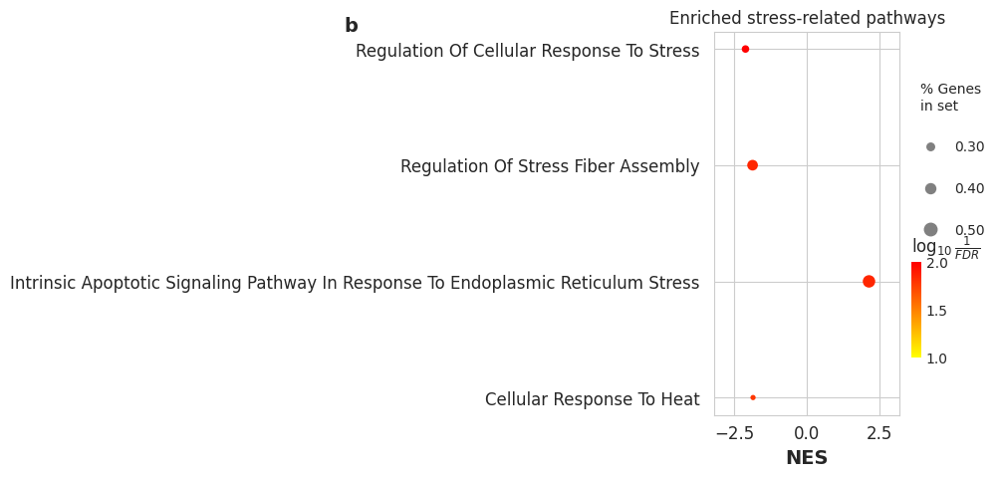

In [13]:
res_selected_ = res_selected.copy()
res_selected_['Term'] = res_selected_['Term'].str.split('(').str[0]
ax = gp.dotplot(res_selected_,
           column='FDR q-val',
           figsize=(3,5),
           title="Enriched stress-related pathways",
           show_ring=False,
           size=3,
           top_term=20,
           cmap = plt.cm.autumn_r)
letter_annotation(ax, -2, 1, 'b', fontsize=14)
# plt.ylabel(plt.gca().yaxis.get_label(), fontsize=4)
plt.yticks(fontsize=fontsize);
plt.xticks(fontsize=fontsize);
plt.xlabel('NES', fontsize=14);
plt.title('Enriched stress-related pathways', fontsize=12)
# plt.savefig(f'{figdir}/{dataset}_stress_pathway_enrichment_fd.pdf', bbox_inches='tight');

In [16]:
pvals = []
# X = adata.layers['counts']
# X = 1e6 * X / X.sum(axis=1)[:, None]
# X = np.log1p(X)
X = adata.X.toarray()
X_ctl = X[adata.obs['control'] == 1]
X_pert = X[adata.obs['control'] == 0]
for i in tqdm(range(adata.shape[-1])):
    t_statistic, p_values = stats.ttest_ind(X_pert[:, i], X_ctl[:, i])
    pvals.append(p_values)
pvals = np.array(pvals)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5060/5060 [00:11<00:00, 423.54it/s]


In [19]:
res_.iloc[:20]

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,gsea,Gene Expression,-0.718676,-2.64144,0.0,0.0,0.0,36/81,3.97%,RPS21;RPL37;RPL37A;RPS28;RPS29;RPL28;RPS15A;RP...
1,gsea,Positive Regulation Of T Cell Activation,0.696175,2.464562,0.0,0.0,0.0,17/36,13.99%,B2M;MDK;AIF1;PYCARD;HLA-A;SMARCC1;CD47;RHOH;AC...
2,gsea,Translation,-0.901838,-2.41044,0.0,0.0,0.0,30/43,3.48%,RPS21;RPL37;RPL37A;RPS28;RPS29;RPL28;RPS15A;RP...
3,gsea,Regulation Of DNA-templated Transcription,0.500502,2.409378,0.0,0.0,0.0,217/441,31.72%,PRAME;APOE;PARP1;CITED2;LIMS1;GPBP1;BTG1;CTCFL...
4,gsea,Positive Regulation Of Response To External St...,0.663734,2.407037,0.0,0.0,0.0,19/45,19.33%,CYBA;MDK;AIF1;PYCARD;NFKBIA;LGALS1;GRN;EMILIN2...
5,gsea,Macromolecule Biosynthetic Process,-0.85511,-2.401087,0.0,0.0,0.0,30/45,3.48%,RPS21;RPL37;RPL37A;RPS28;RPS29;RPL28;RPS15A;RP...
6,gsea,Positive Regulation Of Defense Response,0.681838,2.359283,0.0,0.0,0.0,17/35,19.33%,CYBA;MDK;PYCARD;NFKBIA;LGALS1;GRN;EMILIN2;CD47...
7,gsea,Peptide Biosynthetic Process,-0.905565,-2.354011,0.0,0.0,0.0,29/39,3.48%,RPS21;RPL37;RPL37A;RPS28;RPS29;RPL28;RPS15A;RP...
8,gsea,Positive Regulation Of Inflammatory Response,0.677498,2.27309,0.0,0.000728,0.002,13/28,17.19%,MDK;PYCARD;NFKBIA;LGALS1;GRN;CD47;LCP1;NUPR1;I...
9,gsea,Positive Regulation Of Nucleic Acid-Templated ...,0.499754,2.254787,0.0,0.000607,0.002,80/156,31.60%,APOE;CITED2;CTCFL;REST;CEBPB;ELF1;KMT2E;SMARCC...


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

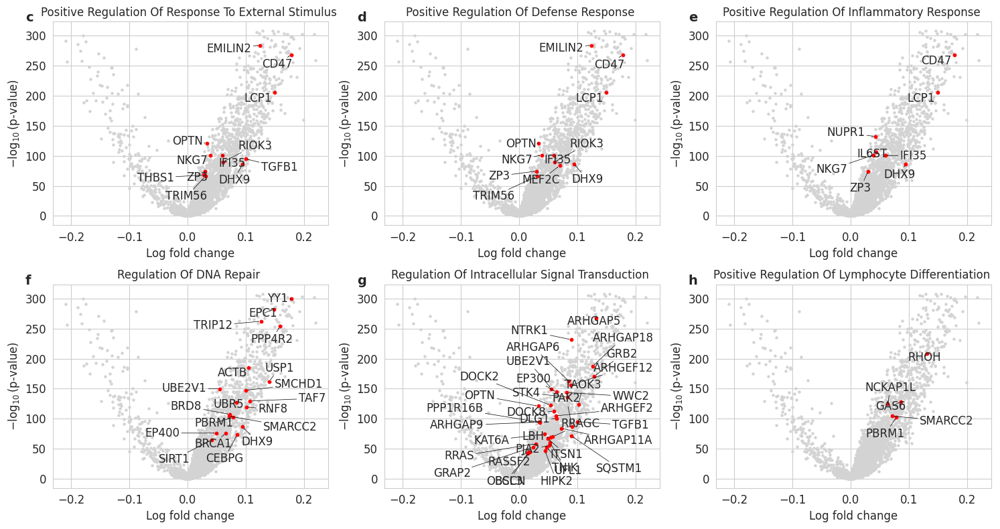

In [20]:
idxs = [4, 6, 8, 12, 13, 19]
nrows = 2
ncols = 3
fontsize=12
eps = 1e-1000

x = X_pert.mean(0) - X_ctl.mean(0)
y = -np.log10(pvals + eps)
gene_names = adata.var['gene_name']
res_ = res.res2d.copy()
res_['Term'] = res_['Term'].str.split('(').str[0]
fig = plt.figure(figsize=(ncols*5, nrows*4))
for i, idx in enumerate(idxs):
    row = res_.loc[idx]
    plt.subplot(nrows, ncols, i+1)
    letter_annotation(plt.gca(), -.1, 1, chr(99 + i), fontsize=14)
    volcano_plot(x, y, row, gene_names, fontsize=fontsize)
plt.tight_layout()
# plt.savefig(f'{figdir}/{dataset}_volcano_combined.pdf', bbox_inches='tight');

In [7]:
enr_results_df = pd.read_csv(f'{outdir}/{dataset}_gsea_bp.csv', index_col=0)
# enr_results_df = res.res2d

In [8]:
keywords = ['heat', 'unfolded', 'cell death', 'stress']
m = [any([k in x.lower() for k in keywords]) for x in enr_results_df['Term'].values]
selected_pathways = np.unique(enr_results_df['Term'].values[m])
selected_pathways

array(['Cellular Response To Chemical Stress (GO:0062197)',
       'Cellular Response To Heat (GO:0034605)',
       'Cellular Response To Osmotic Stress (GO:0071470)',
       'Cellular Response To Oxidative Stress (GO:0034599)',
       'Cellular Response To Unfolded Protein (GO:0034620)',
       'Integrated Stress Response Signaling (GO:0140467)',
       'Intrinsic Apoptotic Signaling Pathway In Response To Endoplasmic Reticulum Stress (GO:0070059)',
       'Negative Regulation Of Cell Death (GO:0060548)',
       'Negative Regulation Of Endoplasmic Reticulum Stress-Induced Intrinsic Apoptotic Signaling Pathway (GO:1902236)',
       'Negative Regulation Of Endoplasmic Reticulum Unfolded Protein Response (GO:1900102)',
       'Negative Regulation Of Oxidative Stress-Induced Cell Death (GO:1903202)',
       'Negative Regulation Of Oxidative Stress-Induced Intrinsic Apoptotic Signaling Pathway (GO:1902176)',
       'Negative Regulation Of Programmed Cell Death (GO:0043069)',
       'Negati

In [9]:
selected_pathways = [
    'Positive Regulation Of Cell Death (GO:0010942)',
    'Positive Regulation Of Response To External Stimulus (GO:0032103)',
    'Endocytosis (GO:0006897)',
    'Phagocytosis (GO:0006909)',
    'Regulation Of Cell Cycle Process (GO:0010564)',
    'Erythrocyte Differentiation (GO:0030218)',
    'Response To Unfolded Protein (GO:0006986)',
    'Regulation Of Cellular Response To Stress (GO:0080135)',
    'Cellular Response To Chemical Stress (GO:0062197)'
]

In [10]:
gene_signatures = []
for p in selected_pathways:
    lead_genes = enr_results_df[enr_results_df['Term'] == p]['Lead_genes'].values[0]
    lead_genes_dict = {k: 1 for k in lead_genes.split(';')}
    sig = GeneSignature(name=p, gene2weight=lead_genes_dict)
    gene_signatures.append(sig)

In [11]:
expr = adata.to_df()
expr.columns = adata.var.loc[expr.columns]['gene_name']
auc_mtx = aucell(expr, gene_signatures)
auc_mtx['control'] = adata.obs.loc[auc_mtx.index]['control']

([0, 1, 2, 3, 4, 5, 6, 7, 8],
 [Text(0, 0, 'Positive Regulation Of Cell Death '),
  Text(1, 0, 'Positive Regulation Of Response To External Stimulus '),
  Text(2, 0, 'Endocytosis '),
  Text(3, 0, 'Phagocytosis '),
  Text(4, 0, 'Regulation Of Cell Cycle Process '),
  Text(5, 0, 'Erythrocyte Differentiation '),
  Text(6, 0, 'Response To Unfolded Protein '),
  Text(7, 0, 'Regulation Of Cellular Response To Stress '),
  Text(8, 0, 'Cellular Response To Chemical Stress ')])

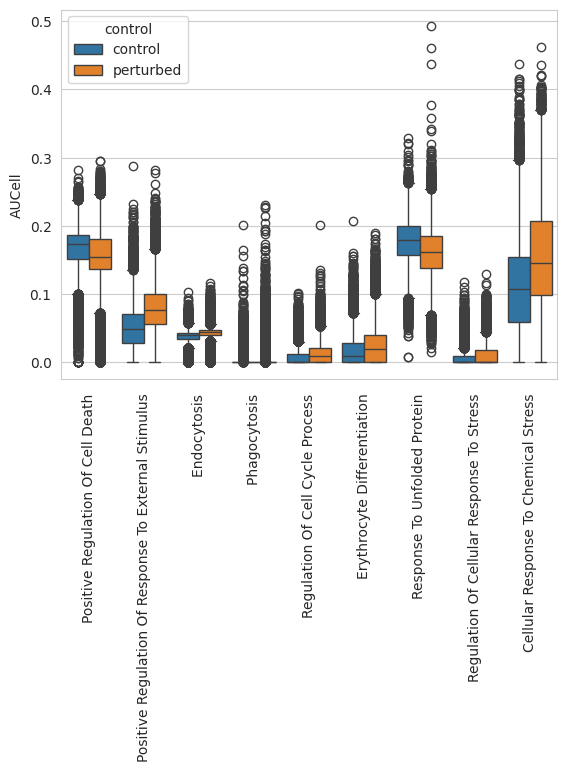

In [13]:
df = auc_mtx.melt(id_vars=['control'])
df['control'] = df['control'].replace({1: 'control', 0: 'perturbed'})
df['Regulon'] = df['Regulon'].str.split('(').str[0]
sns.boxplot(data=df,
            x='Regulon',
            y='value',
            hue='control',
            hue_order=['control', 'perturbed'])

plt.ylabel('AUCell')
plt.xlabel('')
plt.xticks(rotation=90)

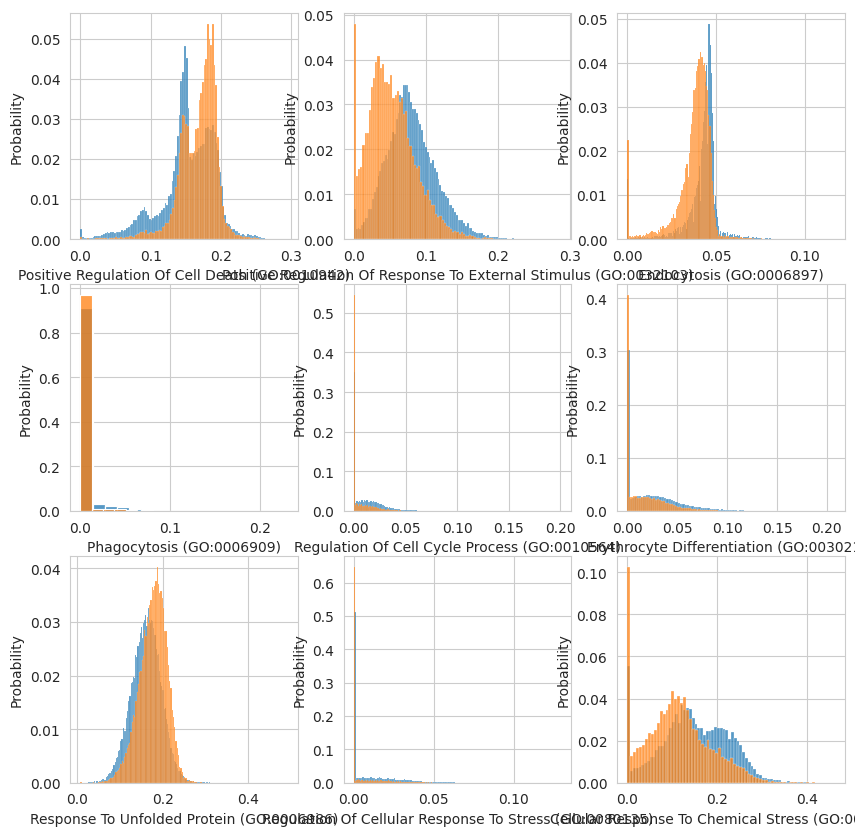

In [14]:
plt.figure(figsize=(10, 10))
for i, p in enumerate(selected_pathways):
    plt.subplot(3, 3, i+1)
    sns.histplot(auc_mtx[auc_mtx['control'] == 0][p], stat='probability')
    sns.histplot(auc_mtx[auc_mtx['control'] == 1][p], stat='probability')

In [143]:
# run PCA then generate UMAP plots
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)

In [149]:
for p in selected_pathways:
    adata.obs[p] = auc_mtx.loc[adata.obs.index][p]
adata.obs['control_str'] = adata.obs['control'].astype(str)

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


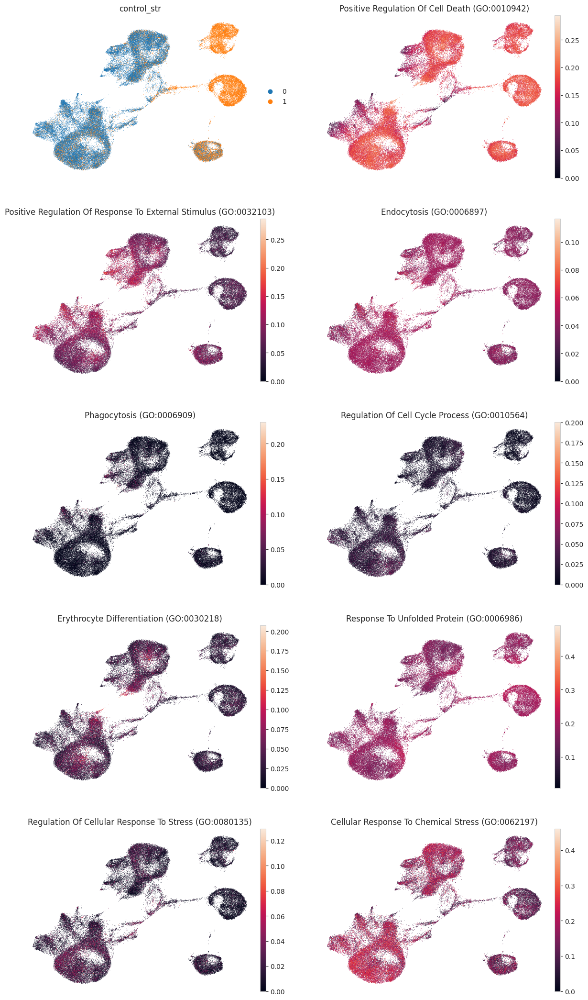

In [17]:
sc.pl.umap(
    adata,
    color=['control_str'] + list(np.array(selected_pathways)),
    ncols=2,
    frameon=False,
)

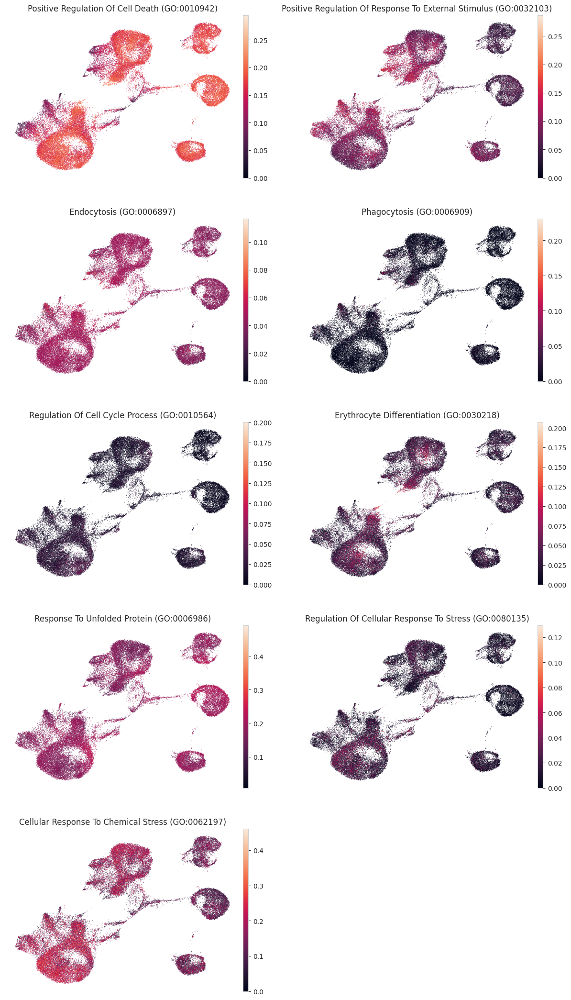

In [18]:
sc.pl.umap(
    adata,
    color=np.array(selected_pathways),
    ncols=2,
    frameon=False,
)

In [22]:
list(np.array(selected_pathways))

['Positive Regulation Of Cell Death (GO:0010942)',
 'Positive Regulation Of Response To External Stimulus (GO:0032103)',
 'Endocytosis (GO:0006897)',
 'Phagocytosis (GO:0006909)',
 'Regulation Of Cell Cycle Process (GO:0010564)',
 'Erythrocyte Differentiation (GO:0030218)',
 'Response To Unfolded Protein (GO:0006986)',
 'Regulation Of Cellular Response To Stress (GO:0080135)',
 'Cellular Response To Chemical Stress (GO:0062197)']

In [147]:
adata.obs['control_str'] = adata.obs['control'].astype(str)
adata.obs['Control vs perturbed'] = ['control' if s == '1' else 'perturbed' for s in adata.obs['control_str']]

In [41]:
sc.settings.figdir = figdir

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


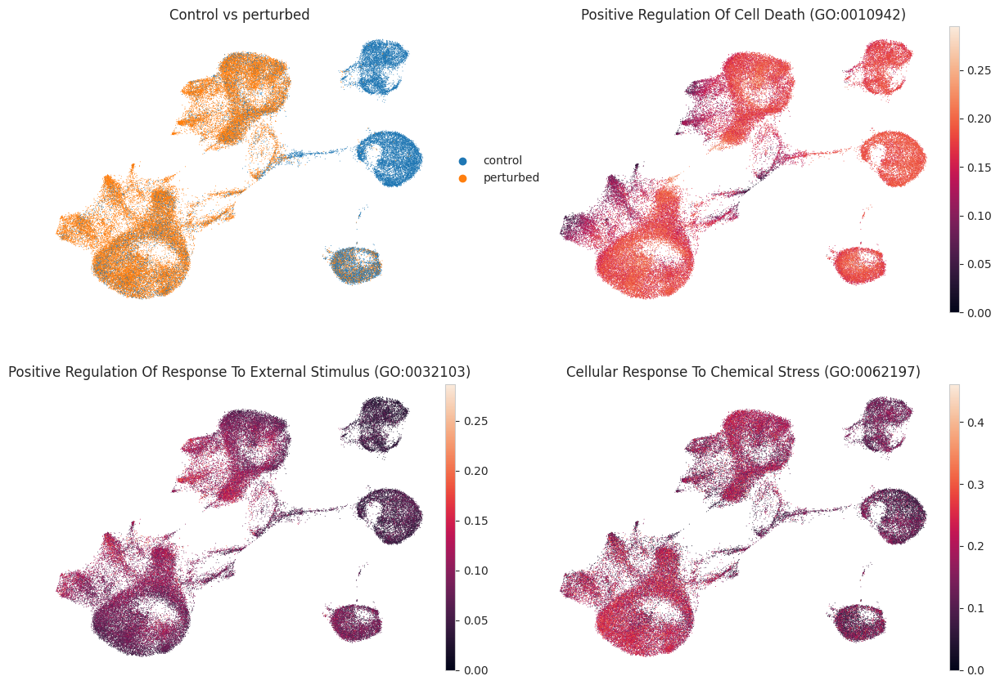

In [43]:
sc.pl.umap(
    adata,
    color=['Control vs perturbed', 'Positive Regulation Of Cell Death (GO:0010942)', 'Positive Regulation Of Response To External Stimulus (GO:0032103)', 'Cellular Response To Chemical Stress (GO:0062197)'],
    ncols=2,
    frameon=False,
    save=f'{dataset}_aucell.png'
)
# plt.tight_layout()
# plt.savefig(f'{figdir}/{dataset}_aucell.pdf')

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


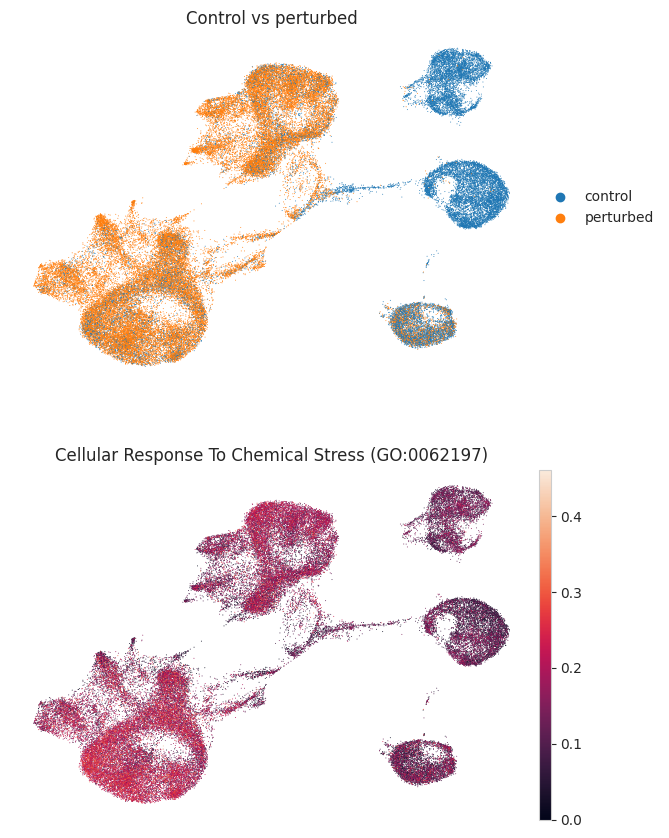

<Figure size 640x480 with 0 Axes>

In [150]:
sc.pl.umap(
    adata,
    color=['Control vs perturbed',  'Cellular Response To Chemical Stress (GO:0062197)'],
    ncols=1,
    frameon=False,
    save=f'{dataset}_aucell_2_vert.png'
)
plt.tight_layout()
# plt.savefig(f'{figdir}/{dataset}_aucell_2.pdf')

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


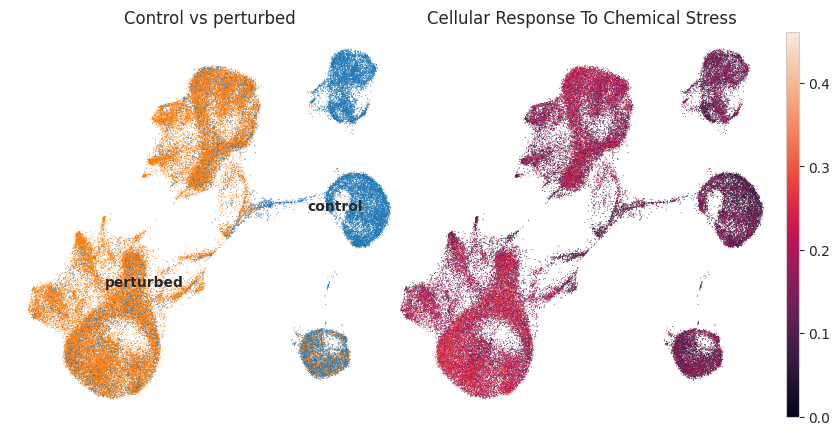

<Figure size 600x500 with 0 Axes>

In [131]:
adata.obs['Cellular Response To Chemical Stress'] = adata.obs['Cellular Response To Chemical Stress (GO:0062197)'] 
with rc_context({"figure.figsize": (6, 5)}):
    fig = sc.pl.umap(
        adata,
        color=['Control vs perturbed',  'Cellular Response To Chemical Stress'],
        ncols=2,
        frameon=False,
        save=f'{dataset}_aucell_4.png',
        legend_loc='on data', #'on data',
        # colorbar_loc=None, #'none', # 'bottom',
        wspace=-0.15,
        # return_fig=True
    )
    plt.tight_layout()
# plt.savefig(f'{figdir}/{dataset}_aucell_2.pdf')

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


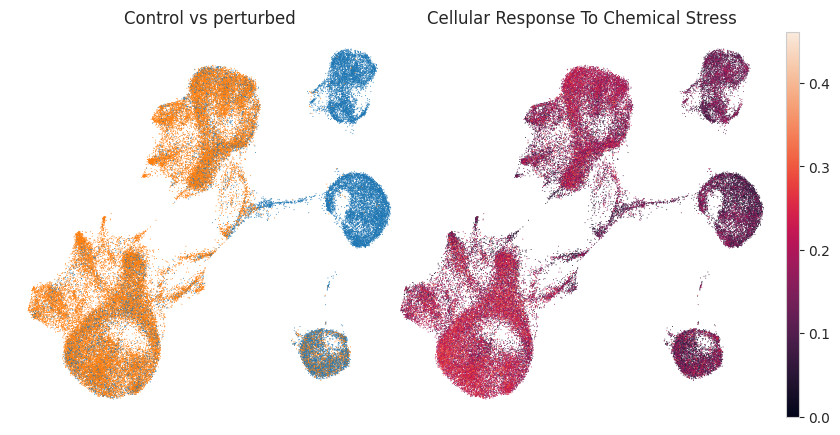

<Figure size 600x500 with 0 Axes>

In [161]:
adata.obs['Cellular Response To Chemical Stress'] = adata.obs['Cellular Response To Chemical Stress (GO:0062197)'] 
with rc_context({"figure.figsize": (6, 5)}):
    fig = sc.pl.umap(
        adata,
        color=['Control vs perturbed',  'Cellular Response To Chemical Stress'],
        ncols=2,
        frameon=False,
        save=f'{dataset}_aucell_4.png',
        legend_loc='none', #'on data',
        # colorbar_loc=None, #'none', # 'bottom',
        wspace=-0.15,
        # return_fig=True
    )
    # print(fig.get_axes())
    plt.tight_layout()
# plt.savefig(f'{figdir}/{dataset}_aucell_2.pdf')

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_708988/3819580366.py:12: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


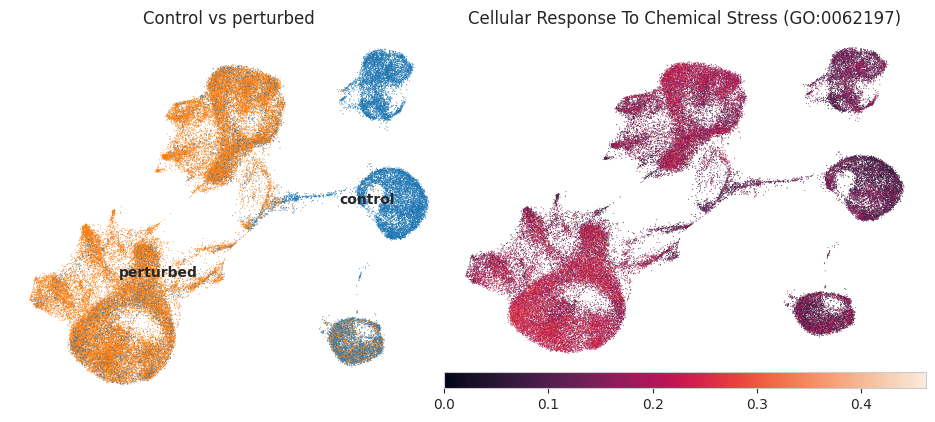

In [106]:
    fig = sc.pl.umap(
        adata,
        color=['Control vs perturbed',  'Cellular Response To Chemical Stress (GO:0062197)'],
        ncols=2,
        frameon=False,
        save=f'{dataset}_aucell_2.png',
        legend_loc='on data',
        colorbar_loc='bottom',
        wspace=-.1,
        return_fig=True
    )
    plt.tight_layout()

/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/vinas/.conda/envs/CPAenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


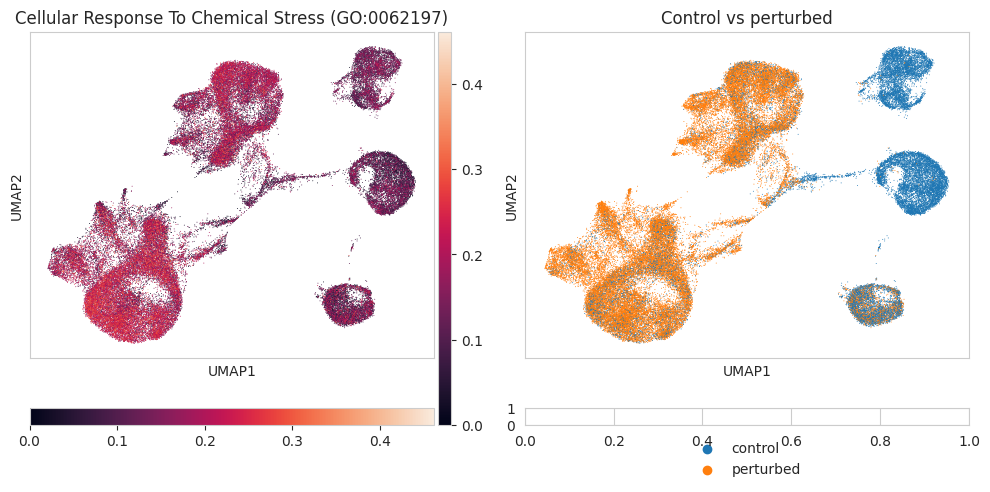

In [65]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Create a figure and subplots for two UMAP plots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Two side-by-side subplots

# Plot UMAP for first variable (continuous)
sc.pl.umap(adata, color='Cellular Response To Chemical Stress (GO:0062197)', ax=axes[0], show=False)

# Create a colorbar beneath the first plot
divider = make_axes_locatable(axes[0])
cax1 = divider.append_axes("bottom", size="5%", pad=0.5)
plt.colorbar(axes[0].collections[0], cax=cax1, orientation="horizontal")  # Horizontal colorbar

# Plot UMAP for second variable (binary)
sc.pl.umap(adata, color='Control vs perturbed', ax=axes[1], show=False)

# Create a legend beneath the second plot
handles, labels = axes[1].get_legend_handles_labels()
divider = make_axes_locatable(axes[1])
leg_ax = divider.append_axes("bottom", size="5%", pad=0.5)
leg = axes[1].legend(handles, labels, loc="lower center", bbox_to_anchor=(0.5, -0.4), ncol=1, frameon=False)

plt.tight_layout()
# plt.show()

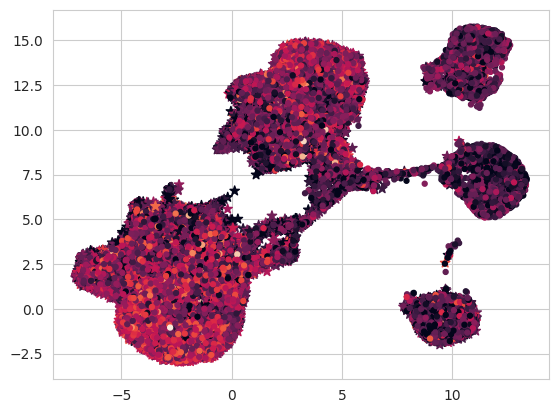

In [55]:
X = adata.obsm['X_umap'][:, 0]
Y = adata.obsm['X_umap'][:, 1]
c = adata.obs['Cellular Response To Chemical Stress (GO:0062197)']
t = adata.obs['Control vs perturbed']

markers = ["*","."]
for i, tt in enumerate(t.unique()):
    plt.scatter(X[t == tt], Y[t == tt], c=c[t == tt], s=50, label=tt, marker=markers[i])

In [80]:
def remove_ax_lines(ax):
    # Hide grid lines
    ax.grid(False)

    # Hide axes ticks
    ax.set_xticks([])
    ax.set_yticks([])
    ax.axis('off')


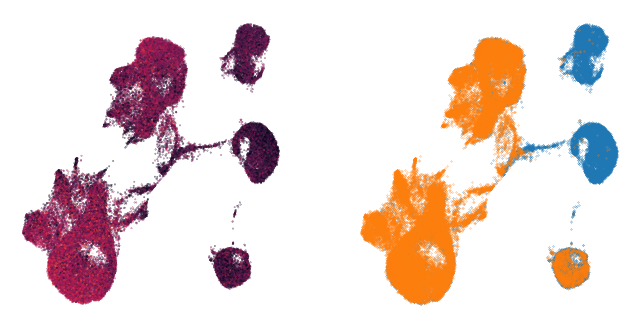

In [83]:
X = adata.obsm['X_umap'][:, 0]
Y = adata.obsm['X_umap'][:, 1]
c = adata.obs['Cellular Response To Chemical Stress (GO:0062197)']
t = adata.obs['Control vs perturbed']
s = 0.05

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.scatter(X, Y, c=c, s=s)
remove_ax_lines(plt.gca())
plt.subplot(1, 2, 2)
for i, tt in enumerate(t.unique()[::-1]):
    plt.scatter(X[t == tt], Y[t == tt], s=s, label=tt)
remove_ax_lines(plt.gca())